This notebook was written by Prach Techameena and was adapted from  
https://scfates.readthedocs.io/en/latest/Tree_Analysis_Bone_marrow_fates.html

# Mounting GG Drive and installing packages

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# This is  used to time the running of the notebook
import time
start_time = time.time()

In [ ]:
%%time
# After finished running please restart the runtime
!pip install scFates && pip install PhenoGraph && pip install palantir && pip install scvelo

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 419 kB 7.1 MB/s 
     |████████████████████████████████| 3.2 MB 63.6 MB/s 
     |████████████████████████████████| 110 kB 84.4 MB/s 
     |████████████████████████████████| 72 kB 826 kB/s 
     |████████████████████████████████| 96 kB 7.1 MB/s 
     |████████████████████████████████| 1.3 MB 71.9 MB/s 
     |████████████████████████████████| 2.0 MB 62.8 MB/s 
     |████████████████████████████████| 8.8 MB 30.9 MB/s 
     |████████████████████████████████| 3.1 MB 48.4 MB/s 
     |████████████████████████████████| 11.2 MB 54.1 MB/s 
     |████████████████████████████████| 88 kB 9.7 MB/s 
     |████████████████████████████████| 959 kB 67.5 MB/s 
     |████████████████████████████████| 1.1 MB 65.0 MB/s 
     |████████████████████████████████| 63 kB 2.2 MB/s 
  Created wheel for adjustText: filename=adjustText-0.7.3-py3-none-any.whl size=7097 sha256=8918b

CPU times: user 302 ms, sys: 68.8 ms, total: 371 ms
Wall time: 29.8 s


In [ ]:
!python --version

Python 3.7.14


# Import packages and preparing dataset

In [ ]:
import warnings
warnings.filterwarnings("ignore")
from anndata import AnnData
import numpy as np
import pandas as pd
import scanpy as sc
import scFates as scf
import palantir
import matplotlib.pyplot as plt
sc.settings.verbosity = 3
## fix palantir breaking down some plots
import seaborn
seaborn.reset_orig()
%matplotlib inline

sc.set_figure_params(facecolor="white", figsize=(8,8), frameon=False)
scf.set_figure_pubready()

In [ ]:
%%time
#@title Enter PATH to a CSV file from Google Drive: { run: "auto", form-width: "40%", display-mode: "form" }
file_path = "/content/drive/MyDrive/PhD/sensoryfates_prac/Data/GSE150150_raw_counts.csv" #@param {type:"string"}
cnts = pd.read_csv(file_path, index_col=0)

CPU times: user 11.6 s, sys: 949 ms, total: 12.6 s
Wall time: 16.5 s


## Preparation of metadata

In [ ]:
%%time
# Define time locations and associated plate IDs
timeloc = ["Cranial12.5","Cranial12.5",
          "DRG10.5","DRG10.5","DRG10.5","DRG10.5",
          "DRG11.5",
          "DRG12.5",
          "DRG9.5","DRG9.5",
          "Trunk10.5","Trunk10.5","Trunk10.5",
          "Trunk9.5"]

plate = ["SS2_15_0073","SS2_15_0169",
                 "SS2_16_688","SS2_16_769","SS2_17_432","SS2_17_433",
                 "SS2_16_385",
                 "SS2_16_384",
                 "SS2_16_767","SS2_17_435",
                 "SS2_18_107","SS2_18_108","SS2_18_109",
                 "SS2_15_0085"]

CPU times: user 2 µs, sys: 0 ns, total: 2 µs
Wall time: 4.53 µs


In [ ]:
%%time
# Assign dictionary where plates IDs are the keys and time locations are the values
timeloc_dict={}
for i in range(len(timeloc)):
    timeloc_dict[plate[i]] = timeloc[i]

CPU times: user 7 µs, sys: 1 µs, total: 8 µs
Wall time: 9.54 µs


In [ ]:
timeloc_dict['SS2_15_0073']

'Cranial12.5'

In [ ]:
cnts

,SS2_15_0073:A9_unique.bam,SS2_15_0073:A8_unique.bam,SS2_15_0073:A7_unique.bam,SS2_15_0073:A6_unique.bam,SS2_15_0073:A5_unique.bam,SS2_15_0073:A4_unique.bam,SS2_15_0073:A3_unique.bam,SS2_15_0073:A2_unique.bam,SS2_15_0073:A10_unique.bam,SS2_15_0073:A1_unique.bam,...,SS2_15_0085:P15_unique.bam,SS2_15_0085:P16_unique.bam,SS2_15_0085:P17_unique.bam,SS2_15_0085:P18_unique.bam,SS2_15_0085:P19_unique.bam,SS2_15_0085:P20_unique.bam,SS2_15_0085:P24_unique.bam,SS2_15_0085:P21_unique.bam,SS2_15_0085:P23_unique.bam,SS2_15_0085:P22_unique.bam
ERCC-00130,3683,2200,4728,2424,7104,3931,5185,7100,3191,950,...,2268,2399,1506,1256,2209,2802,13336,2592,3351,1098
ERCC-00004,1972,961,1973,1008,1820,1319,1967,2119,1047,570,...,730,769,464,370,757,956,3345,1022,822,350
ERCC-00136,422,288,747,323,1131,546,802,1143,522,104,...,314,446,229,211,226,391,1737,400,439,122
ERCC-00108,617,358,987,477,1185,420,743,926,651,200,...,335,407,276,191,306,339,664,175,335,137
ERCC-00116,0,0,0,1,0,0,57,5,4,2,...,0,0,0,9,3,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Tmlhe,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Vamp7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Spry3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Zf12,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
%%time
# Extract the cell IDs from the DataFrame and only keep the plate ID where each cell comes from
cell_names = cnts.columns.to_list()
cell_plate = []
for i in cell_names:
    cell_plate.append(i.split(':')[0])

CPU times: user 1.13 ms, sys: 10 µs, total: 1.14 ms
Wall time: 1.14 ms


In [ ]:
%%time
# Check if the plate IDs are keys in timeloc_dict then assign the time location associated to a particular plate IDs
timepoints = cell_plate.copy()
for idx, i in enumerate(timepoints):
    if timepoints[idx] in timeloc_dict.keys():
        timepoints[idx] = timeloc_dict[i]

CPU times: user 1.28 ms, sys: 0 ns, total: 1.28 ms
Wall time: 1.29 ms


In [ ]:
%%time
# Extract only the developmental time points from the time locations and save them in a new list
import re
times = []
for i in range(len(timepoints)):
    time = re.findall(r'[\d]*[.][\d]+', timepoints[i])
    times.append(float(time[0]))

CPU times: user 10.9 ms, sys: 0 ns, total: 10.9 ms
Wall time: 12.3 ms


In [ ]:
%%time
# Create a dictionary of the prepared metadata and construct the DF from this dictionary
anno_dict = {"cell" : cnts.columns.tolist(), "exp" : cell_plate, "timepoints" : timepoints, "time" : times}
anno = pd.DataFrame(anno_dict)
anno = anno.set_index('cell')

CPU times: user 2.43 ms, sys: 882 µs, total: 3.31 ms
Wall time: 5.48 ms


## Create Anndata obj and perform preprocessing

In [ ]:
%%time
# Create AnnData obj
adata = sc.AnnData(cnts.transpose(), obs=anno)

CPU times: user 73.7 ms, sys: 46.8 ms, total: 120 ms
Wall time: 122 ms


In [ ]:
%%time
# This would show the nature of the AnnData obj we just created
adata

CPU times: user 4 µs, sys: 0 ns, total: 4 µs
Wall time: 7.87 µs


AnnData object with n_obs × n_vars = 5376 × 24582
    obs: 'exp', 'timepoints', 'time'

In [ ]:
%%time
# Preliminary cell filtering
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)

filtered out 93 cells that have less than 200 genes expressed
filtered out 2885 genes that are detected in less than 3 cells
CPU times: user 641 ms, sys: 121 ms, total: 761 ms
Wall time: 767 ms


### QC of the counts

In [ ]:
%%time
# Calculate the ERCC spike-in control metric
adata.var['ERCC'] = adata.var_names.str.startswith('ERCC-')
sc.pp.calculate_qc_metrics(adata, qc_vars=['ERCC'], percent_top=None, log1p=False, inplace=True)

CPU times: user 260 ms, sys: 2.9 ms, total: 263 ms
Wall time: 263 ms


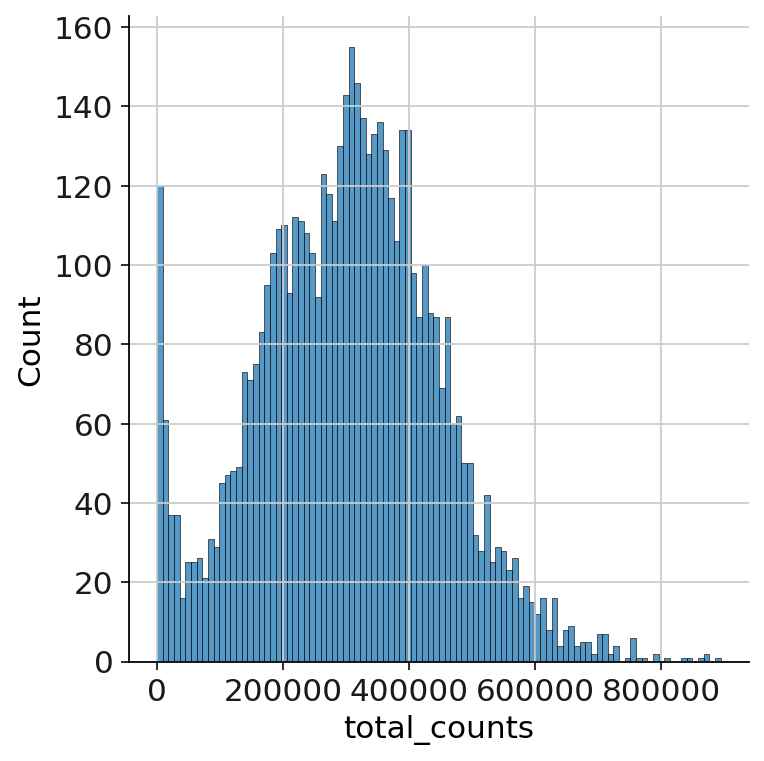

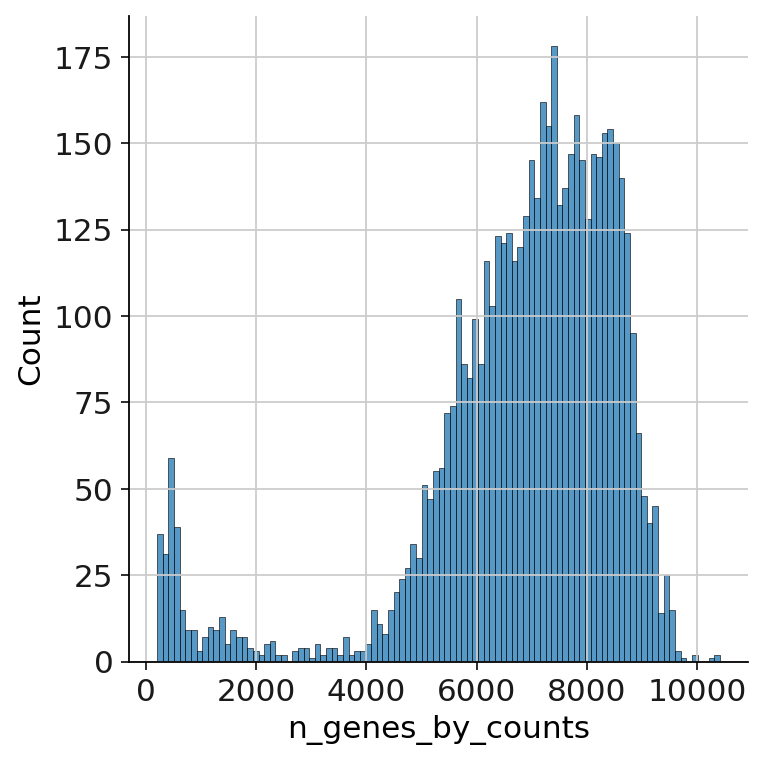

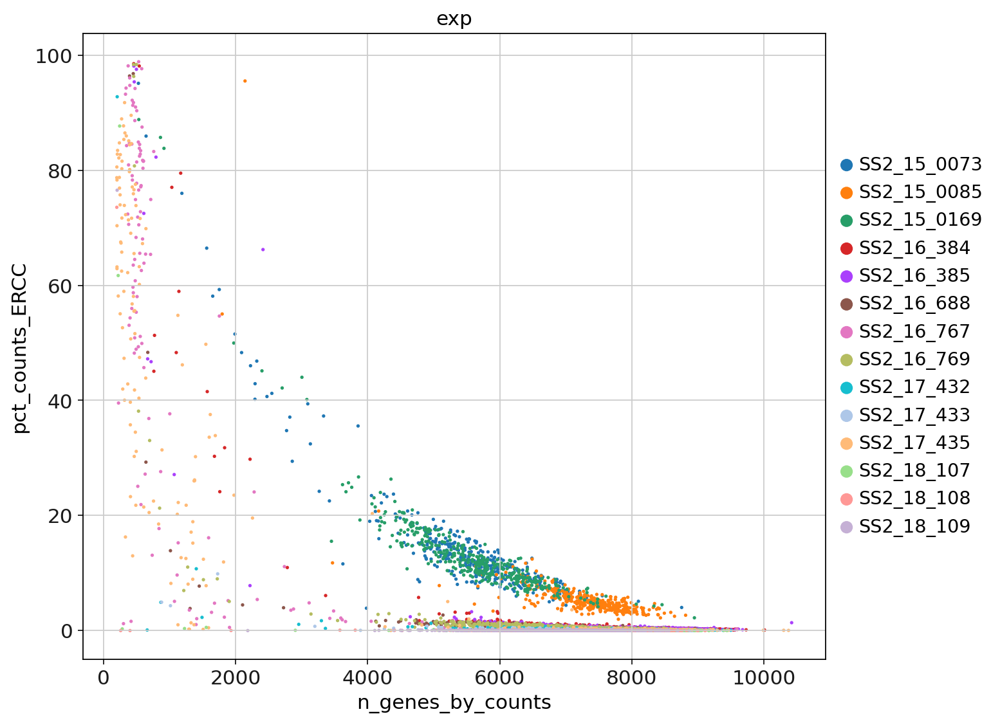

In [ ]:
seaborn.displot(adata.obs["total_counts"], kde=False, bins=100)
seaborn.displot(adata.obs["n_genes_by_counts"], kde=False, bins=100)
sc.pl.scatter(adata, x='n_genes_by_counts', y='pct_counts_ERCC', color='exp')

In [ ]:
%%time
#@title Choose the filter cutoff for each parameter
total_counts =  0.5e5 #@param {type:"number"}
n_genes_by_counts =  4000 #@param {type:"number"}
pct_counts_ERCC =  25 #@param {type:"number"}

# Choose the filter cutoff for each parameter
filter_by_total_counts = adata.obs.total_counts > total_counts
filter_by_expr_features = adata.obs.n_genes_by_counts > n_genes_by_counts
filter_by_ERCC = adata.obs.pct_counts_ERCC < pct_counts_ERCC

CPU times: user 2.05 ms, sys: 0 ns, total: 2.05 ms
Wall time: 1.95 ms


In [ ]:
%%time
# Save the cutoff under obs of AnnData obj
adata.obs['use'] = (
  # sufficient features (genes)
  filter_by_expr_features &
    # sufficient molecules counted
    filter_by_total_counts &
    # sufficient endogenous RNA
    filter_by_ERCC
)

CPU times: user 672 µs, sys: 61 µs, total: 733 µs
Wall time: 739 µs


In [ ]:
%%time
# Actual subset of the AnnData object with cells that passed the QC, and save cells that did not passed the QC in another obj for comparison
adata_filtered = adata[adata.obs['use'], :].copy()
cells_out_of_QC = adata.obs.index[~adata.obs['use']].copy()

CPU times: user 63.3 ms, sys: 118 µs, total: 63.4 ms
Wall time: 63.5 ms


In [ ]:
%%time
# Add developmental locations to the metadata
tps = adata_filtered.obs.timepoints
location = []
for i in range(len(tps)):
    location.append(re.sub(r'[\.0-9]+', '', tps[i]))
location_dict = {'locations':location}
location_df = pd.DataFrame(location_dict, index=adata_filtered.obs.index)
adata_filtered.obs['locations'] = location_df

CPU times: user 38.9 ms, sys: 0 ns, total: 38.9 ms
Wall time: 39.6 ms


In [ ]:
%%time
# Save untransformed count matrix under AnnData.layer in case we messed up and have to comme back
adata_filtered.layers['counts'] = adata_filtered.X.copy()

CPU times: user 25 ms, sys: 0 ns, total: 25 ms
Wall time: 27.3 ms


### Normalization and clustering

In [ ]:
adata_filtered

AnnData object with n_obs × n_vars = 4910 × 21697
    obs: 'exp', 'timepoints', 'time', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_ERCC', 'pct_counts_ERCC', 'use', 'locations'
    var: 'n_cells', 'ERCC', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'exp_colors'
    layers: 'counts'

In [ ]:
%%time
# Normalization and log transform of the count metrix. We also save the transformed count under AnnData.raw
sc.pp.normalize_total(adata_filtered)
sc.pp.log1p(adata_filtered)
adata_filtered.raw = adata_filtered

normalizing counts per cell
    finished (0:00:00)
CPU times: user 1.11 s, sys: 12.9 ms, total: 1.13 s
Wall time: 1.13 s


In [ ]:
 %%time
#@title Choose the flavor of a method (from 'seurat', 'cell_ranger', 'seurat_v3'), and total nuber of genes to select highly variable genes

flavor = 'cell_ranger' #@param {type: "string"}
top_genes = 2000 #@param {type:"number"}

sc.pp.highly_variable_genes(adata_filtered, n_top_genes=round(len(adata_filtered.var)*0.25), flavor=flavor)
# sc.pp.highly_variable_genes(adata_filtered, n_top_genes=top_genes, flavor=flavor)

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
CPU times: user 550 ms, sys: 46.7 ms, total: 597 ms
Wall time: 605 ms


In [ ]:
%%time
# Only keep the highly variable genes within the AnnData obj
adata_filtered = adata_filtered[:, adata_filtered.var.highly_variable]

CPU times: user 8.68 ms, sys: 884 µs, total: 9.57 ms
Wall time: 10.1 ms


In [ ]:
adata_filtered

View of AnnData object with n_obs × n_vars = 4910 × 5424
    obs: 'exp', 'timepoints', 'time', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_ERCC', 'pct_counts_ERCC', 'use', 'locations'
    var: 'n_cells', 'ERCC', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'exp_colors', 'log1p', 'hvg'
    layers: 'counts'

In [ ]:
%%time
# Now we regress out the pct_counts_ERCC from further downstream analysis and scale the count matrix
sc.pp.regress_out(adata_filtered, ['pct_counts_ERCC'], n_jobs=2)
sc.pp.scale(adata_filtered)

regressing out ['pct_counts_ERCC']
    finished (0:00:15)
CPU times: user 837 ms, sys: 392 ms, total: 1.23 s
Wall time: 15.2 s


In [ ]:
%%time
#@title Select the total number of PCs for PCA calculation. Higher number usually capture more variance (Please note that the first two PCs capture the most of the variance)

pcs = 100 #@param {type:"number"}
sc.tl.pca(adata_filtered, n_comps=pcs, svd_solver='arpack')

computing PCA
    on highly variable genes
    with n_comps=100
    finished (0:00:02)
CPU times: user 4.23 s, sys: 217 ms, total: 4.45 s
Wall time: 2.33 s


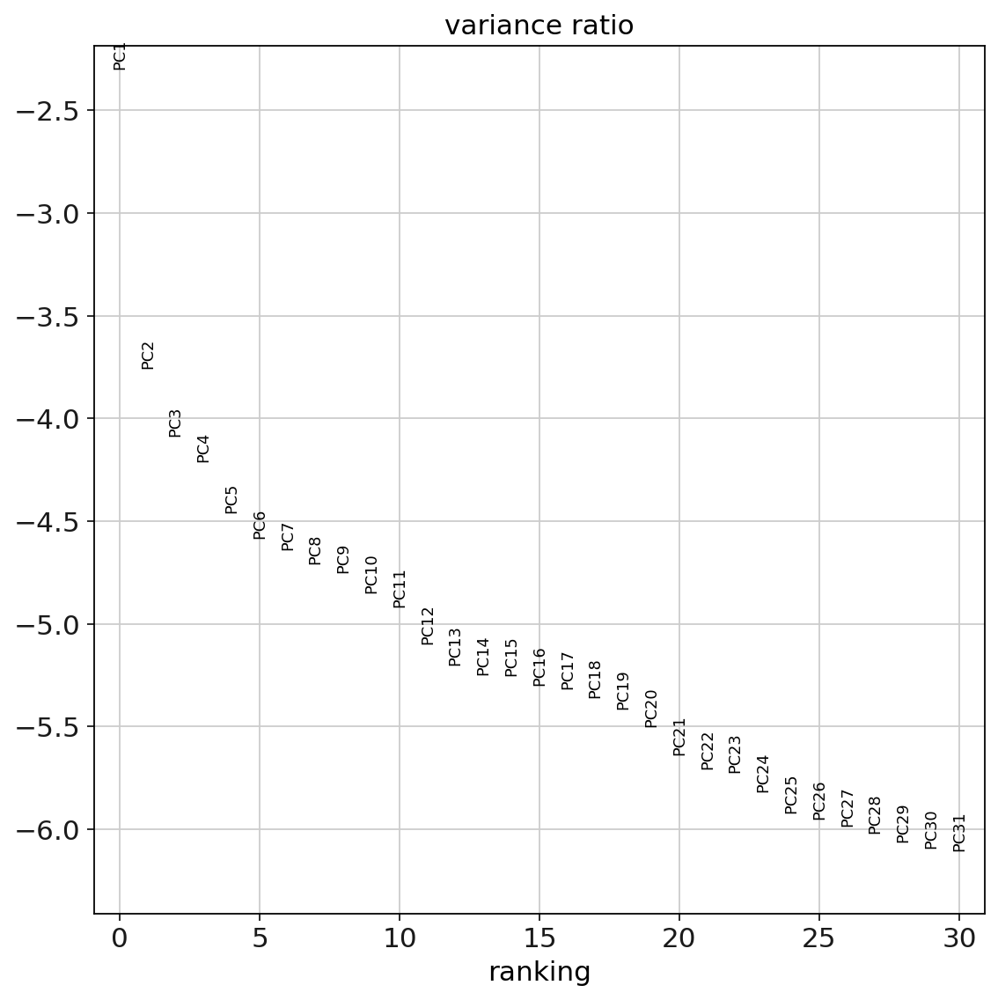

CPU times: user 255 ms, sys: 108 ms, total: 363 ms
Wall time: 257 ms


In [ ]:
%%time
# We will use the heuristic approach to determine the number of PCs for further analysis
sc.pl.pca_variance_ratio(adata_filtered, log=True, n_pcs=30)

In [ ]:
%%time
pcs = 30 #@param {type:"number"}
neighbors = 30 #@param {type:"number"}
resolution = 0.2 #@param {type:"number"}
min_dist = 0.5 #@param {type:"number"}

sc.pp.neighbors(adata_filtered, n_neighbors=neighbors, n_pcs=pcs)
sc.tl.leiden(adata_filtered, resolution=resolution)
sc.tl.umap(adata_filtered, min_dist=min_dist)

computing neighbors
    using 'X_pca' with n_pcs = 30
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:14)
running Leiden clustering
    finished: found 13 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:10)
CPU times: user 24.8 s, sys: 678 ms, total: 25.5 s
Wall time: 25.2 s


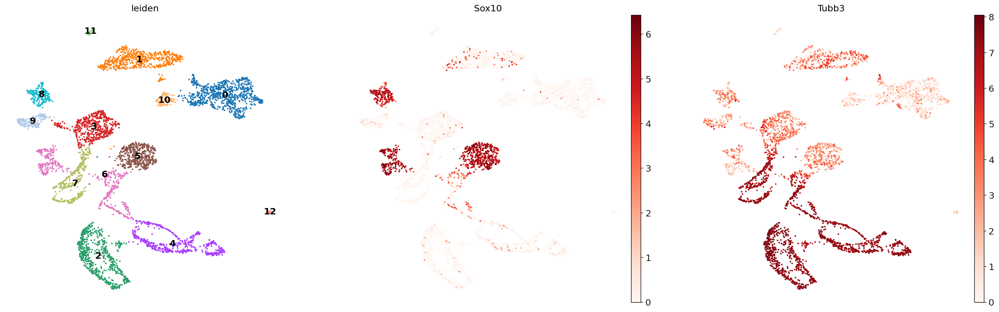

CPU times: user 584 ms, sys: 104 ms, total: 688 ms
Wall time: 575 ms


In [ ]:
%%time
# Visualization of UMAP plot
sc.pl.umap(adata_filtered, color=['leiden', 'Sox10', 'Tubb3'], cmap='Reds', legend_loc='on data')

In [ ]:
%%time
# Select cells in clusters that represent the sensory neurons
adata_filtered = adata_filtered[adata_filtered.obs['leiden'].isin(['2', '4', '5', '6', '7', '8'])].copy()

CPU times: user 149 ms, sys: 21.9 ms, total: 171 ms
Wall time: 187 ms


# Preliminary clustering of sensory neurons

In [ ]:
%%time
adata_sensory = adata_filtered.raw.to_adata().copy()

CPU times: user 28.9 ms, sys: 57.9 ms, total: 86.7 ms
Wall time: 87.4 ms


In [ ]:
adata_sensory

AnnData object with n_obs × n_vars = 2585 × 21697
    obs: 'exp', 'timepoints', 'time', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_ERCC', 'pct_counts_ERCC', 'use', 'locations', 'leiden'
    var: 'n_cells', 'ERCC', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'exp_colors', 'log1p', 'hvg', 'pca', 'neighbors', 'leiden', 'umap', 'leiden_colors'
    obsm: 'X_pca', 'X_umap'
    obsp: 'distances', 'connectivities'

In [ ]:
%%time
adata_sensory.var['mt'] = adata_sensory.var_names.str.startswith('Mt')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata_sensory, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

CPU times: user 182 ms, sys: 1.77 ms, total: 184 ms
Wall time: 210 ms


In [ ]:
%%time
sc.pp.regress_out(adata_sensory, ['pct_counts_mt'], n_jobs=2)

regressing out ['pct_counts_mt']
    finished (0:00:37)
CPU times: user 916 ms, sys: 495 ms, total: 1.41 s
Wall time: 37.6 s


In [ ]:
%%time
#@title Choose the flavor of a method (from 'seurat', 'cell_ranger', 'seurat_v3'), and total nuber of genes to select highly variable genes

flavor = 'cell_ranger' #@param {type: "string"}
top_genes = 2000 #@param {type:"number"}

sc.pp.highly_variable_genes(adata_sensory, n_top_genes=round(len(adata_sensory.var)*0.25), flavor=flavor)
# sc.pp.highly_variable_genes(adata_sensory, n_top_genes=top_genes, flavor=flavor)


If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
CPU times: user 702 ms, sys: 11.9 ms, total: 714 ms
Wall time: 720 ms


In [ ]:
%%time
#@title Select the total number of PCs for PCA calculation. Higher number usually capture more variance (Please note that the first two PCs capture the most of the variance)

pcs = 100 #@param {type:"number"}

sc.tl.pca(adata_sensory, n_comps=pcs, svd_solver='arpack', use_highly_variable=True)

computing PCA
    on highly variable genes
    with n_comps=100
    finished (0:00:01)
CPU times: user 3.43 s, sys: 248 ms, total: 3.68 s
Wall time: 1.95 s


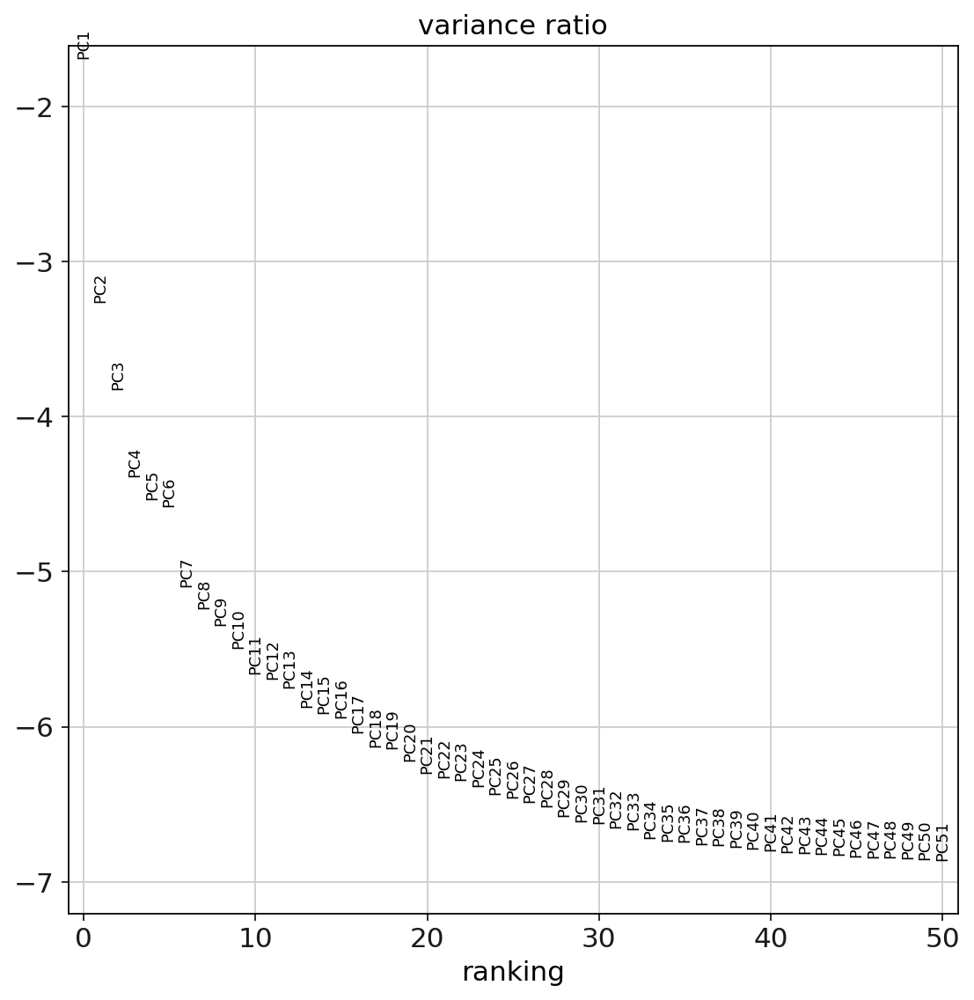

CPU times: user 339 ms, sys: 81.7 ms, total: 421 ms
Wall time: 354 ms


In [ ]:
%%time
# We will use the heuristic approach to determine the number of PCs for further analysis
pcs =  50#@param {type:"number"}
sc.pl.pca_variance_ratio(adata_sensory, log=True, n_pcs=pcs)

In [ ]:
%%time
pcs = 30 #@param {type:"number"}
neighbors = 100 #@param {type:"number"}
resolution = 0.6 #@param {type:"number"}
min_dist = 0.3 #@param {type:"number"}

sc.pp.neighbors(adata_sensory, n_neighbors=neighbors, n_pcs=pcs)
sc.tl.leiden(adata_sensory, resolution=resolution)
sc.tl.umap(adata_sensory, min_dist=min_dist)

computing neighbors
    using 'X_pca' with n_pcs = 30
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 14 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:08)
CPU times: user 9.34 s, sys: 378 ms, total: 9.72 s
Wall time: 9.41 s


In [ ]:
adata_sensory.obs.time = adata_sensory.obs.time.astype('category')

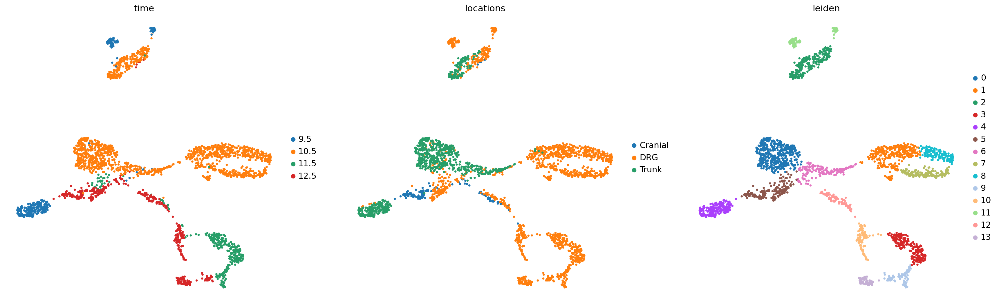

In [ ]:
sc.pl.umap(adata_sensory, color=['time', 'locations', 'leiden'])

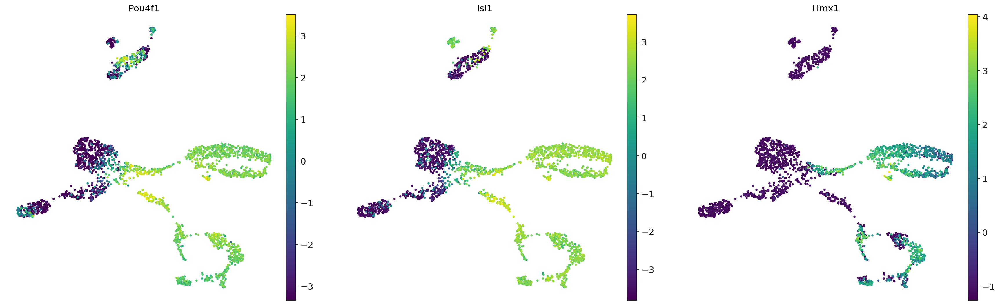

In [ ]:
sc.pl.umap(adata_sensory, color=['Pou4f1','Isl1', 'Hmx1'])

In [ ]:
%%time
adata_sensory=adata_sensory[~adata_sensory.obs.leiden.isin(['2','11'])]
sc.pp.neighbors(adata_sensory, n_neighbors=100, n_pcs=30)
sc.tl.leiden(adata_sensory, resolution=0.6)
sc.tl.umap(adata_sensory, min_dist=0.45)
adata_sensory.obs.time = adata_sensory.obs.time.astype('category')

computing neighbors
    using 'X_pca' with n_pcs = 30
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
running Leiden clustering
    finished: found 13 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:07)
CPU times: user 8.41 s, sys: 250 ms, total: 8.66 s
Wall time: 8.79 s


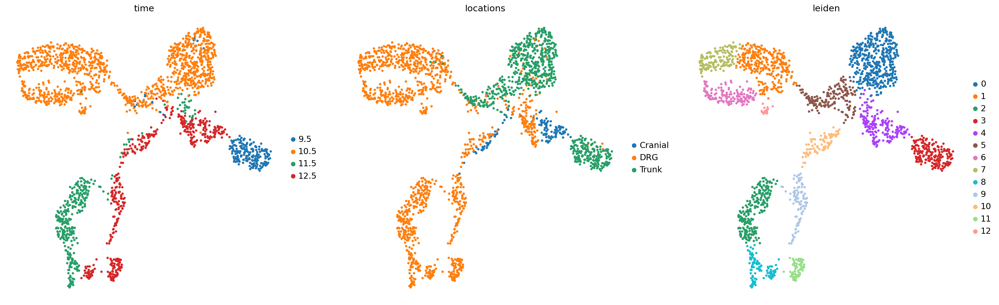

CPU times: user 1.22 s, sys: 110 ms, total: 1.33 s
Wall time: 1.2 s


In [ ]:
%%time
sc.pl.umap(adata_sensory, color=['time', 'locations', 'leiden'])

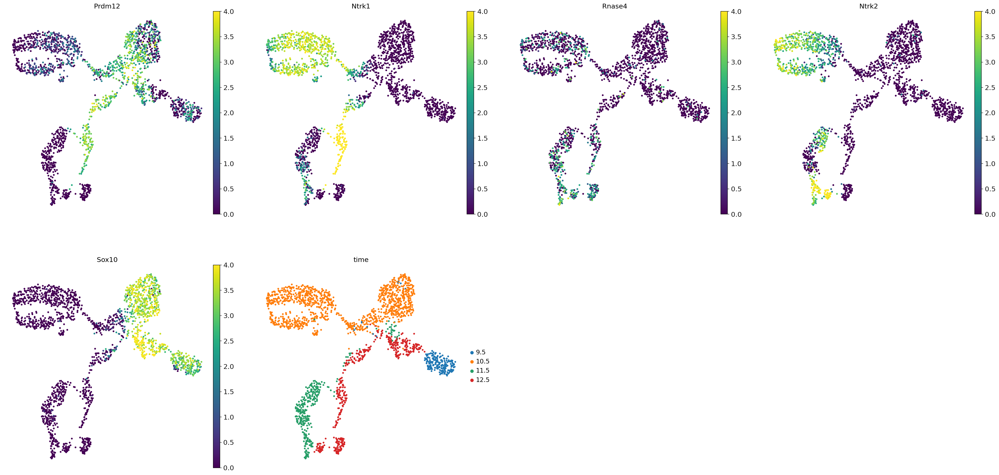

CPU times: user 1.2 s, sys: 104 ms, total: 1.31 s
Wall time: 1.22 s


In [ ]:
%%time
gene = "Prdm12" #@param {type:"string"}

sc.pl.umap(adata_sensory, color=[gene,'Ntrk1', 'Rnase4', 'Ntrk2', 'Sox10','time'], vmin=0, vmax=4)

In [ ]:
sensory_obsp = adata_sensory.obsp.copy()

# ScFates workflow

## Run Palantir

In [ ]:
%%time
# Run diffusion maps
pca_projections = pd.DataFrame(adata_sensory.obsm['X_pca'], index=adata_sensory.obs_names)
dm_res = palantir.utils.run_diffusion_maps(pca_projections, n_components=40)

Determing nearest neighbor graph...
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
CPU times: user 388 ms, sys: 150 ms, total: 538 ms
Wall time: 330 ms


In [ ]:
%%time
# Determine the multiscal space of diffusion maps
ms_data = palantir.utils.determine_multiscale_space(dm_res)

CPU times: user 1.63 ms, sys: 982 µs, total: 2.62 ms
Wall time: 1.55 ms


In [ ]:
%%time
# Save the latent representation of plantir unider obsm of AnData
adata_sensory.obsm["X_palantir"]=ms_data.values

CPU times: user 0 ns, sys: 172 µs, total: 172 µs
Wall time: 89.9 µs


In [ ]:
adata_sensory.obsm

AxisArrays with keys: X_pca, X_umap, X_palantir

## Fitting tree using SimplePPT

In [ ]:
%%time
adata_early=adata_sensory[adata_sensory.obs.leiden.isin(['0','3','4'])].copy()
adata_late=adata_sensory[~adata_sensory.obs.leiden.isin(['0','3','4'])].copy()

CPU times: user 73.9 ms, sys: 3.01 ms, total: 76.9 ms
Wall time: 75.4 ms


In [ ]:
%%time
#@title Adjust point parameter
Nodes = 350 #@param {type:"slider", min:10, max:1000, step:50}
sigma = 0.07 #@param {type:"number", min:0.01, max:3, step:0.01}
ppt_lambda = 10500 #@param {type:"slider", min:1, max:20000, step:500}
ppt_nsteps = 200 #@param {type:"slider", min:0, max:300, step:5}

scf.tl.tree(adata_late,Nodes=Nodes,use_rep="palantir",method="ppt",device="cpu",ppt_sigma=sigma,ppt_lambda=ppt_lambda,seed=1, ppt_nsteps=ppt_nsteps)

inferring a principal tree --> parameters used 
    350 principal points, sigma = 0.07, lambda = 10500, metric = euclidean
    fitting:   5%|▌         | 10/200 [00:01<00:24,  7.88it/s]
    converged
    finished (0:00:01) --> added 
    .uns['ppt'], dictionnary containing inferred tree.
    .obsm['X_R'] soft assignment of cells to principal points.
    .uns['graph']['B'] adjacency matrix of the principal points.
    .uns['graph']['F'] coordinates of principal points in representation space.
CPU times: user 1.45 s, sys: 453 ms, total: 1.91 s
Wall time: 1.32 s


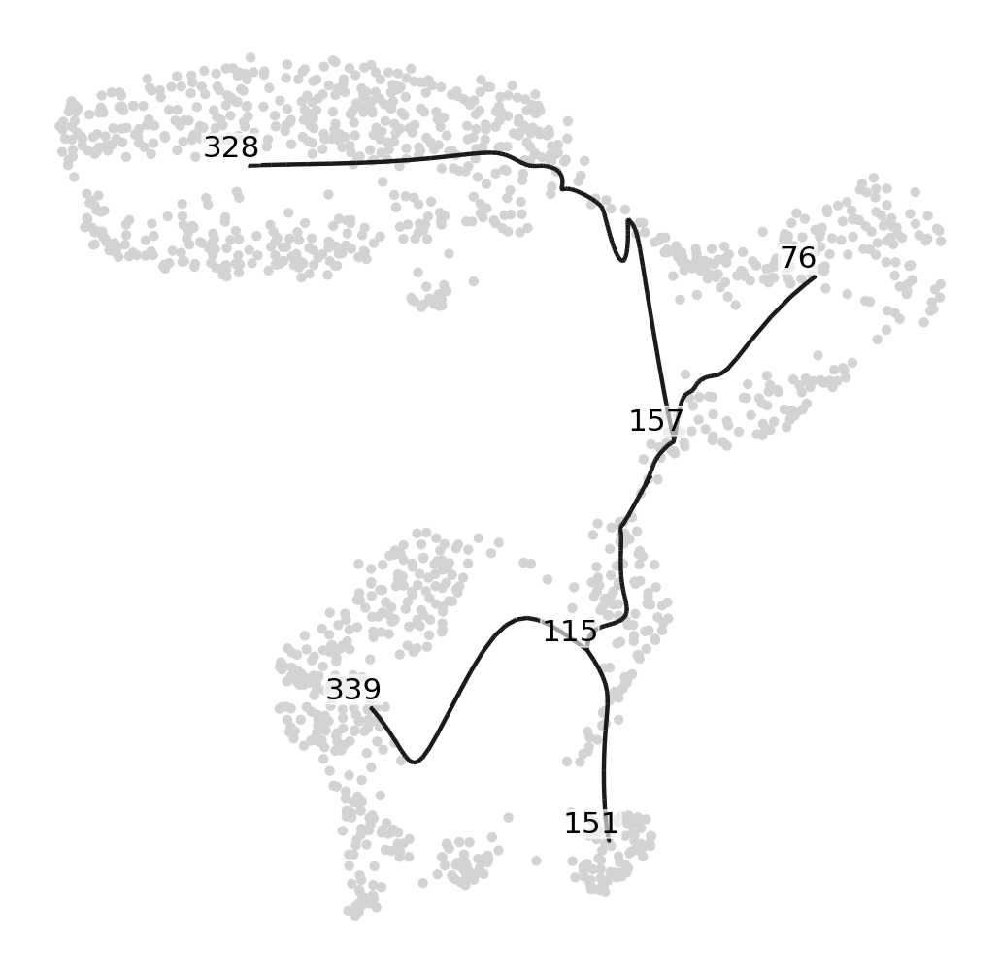

CPU times: user 240 ms, sys: 159 ms, total: 399 ms
Wall time: 230 ms


In [ ]:
%%time
scf.pl.graph(adata_late,size_nodes=.1)

In [ ]:
%%time
scf.tl.cleanup(adata_late,minbranchlength=3)

    graph cleaned --> removed 0 principal points
CPU times: user 10.7 ms, sys: 976 µs, total: 11.7 ms
Wall time: 14.2 ms


In [ ]:
%%time
#@title Adjust point parameter
Nodes = 800 #@param {type:"slider", min:10, max:1000, step:50}
sigma = 0.055 #@param {type:"number", min:0.01, max:3, step:0.01}
ppt_lambda = 8000 #@param {type:"slider", min:1, max:10000, step:500}
ppt_nsteps = 200 #@param {type:"slider", min:0, max:300, step:5}

scf.tl.tree(adata_early,Nodes=Nodes,use_rep="palantir",method="ppt",device="cpu",ppt_sigma=sigma,ppt_lambda=ppt_lambda,seed=1, ppt_nsteps=ppt_nsteps)

inferring a principal tree --> parameters used 
    800 principal points, sigma = 0.055, lambda = 8000, metric = euclidean
    fitting:   2%|▎         | 5/200 [00:00<00:33,  5.87it/s]
    converged
    finished (0:00:00) --> added 
    .uns['ppt'], dictionnary containing inferred tree.
    .obsm['X_R'] soft assignment of cells to principal points.
    .uns['graph']['B'] adjacency matrix of the principal points.
    .uns['graph']['F'] coordinates of principal points in representation space.
CPU times: user 1.08 s, sys: 767 ms, total: 1.84 s
Wall time: 981 ms


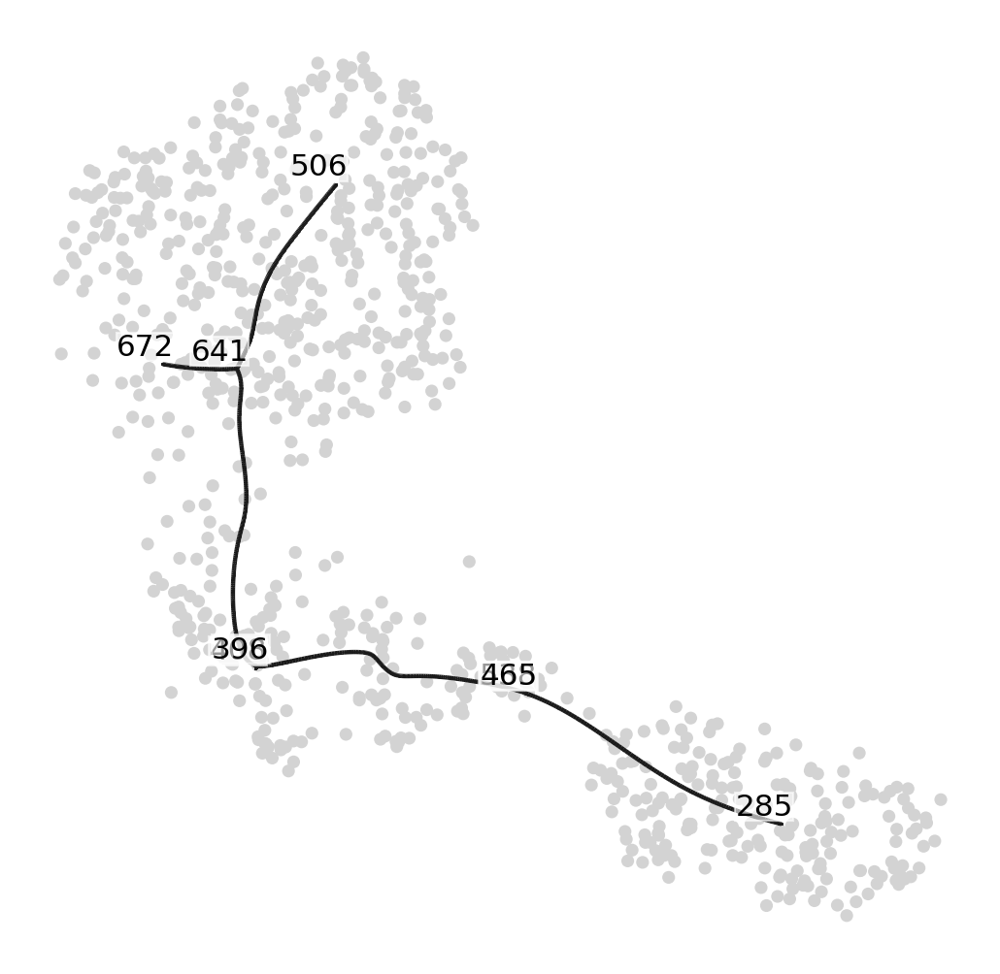

CPU times: user 252 ms, sys: 199 ms, total: 451 ms
Wall time: 250 ms


In [ ]:
%%time
scf.pl.graph(adata_early,size_nodes=.1)

CPU times: user 116 ms, sys: 82 ms, total: 198 ms
Wall time: 119 ms


<AxesSubplot:xlabel='UMAP1', ylabel='UMAP2'>

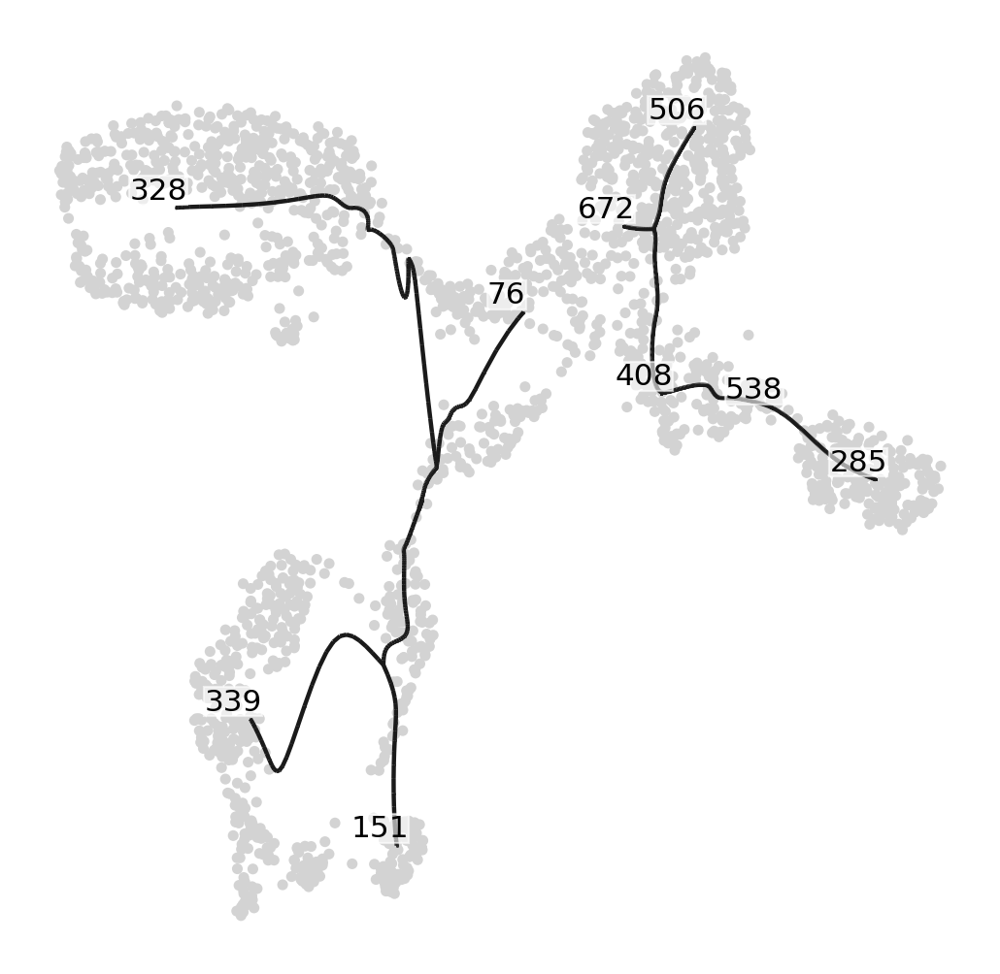

In [ ]:
%%time
ax=scf.pl.graph(adata_early,size_nodes=.1,forks=False,show=False,s=100)
scf.pl.graph(adata_late,size_nodes=.1,forks=False,show=False,s=100,ax=ax)

In [ ]:
%%time
scf.tl.cleanup(adata_early,minbranchlength=10, leaves=[408, 538])

    graph cleaned --> removed 35 principal points
CPU times: user 53.3 ms, sys: 9.04 ms, total: 62.4 ms
Wall time: 64.2 ms


CPU times: user 103 ms, sys: 82.1 ms, total: 185 ms
Wall time: 100 ms


<AxesSubplot:xlabel='UMAP1', ylabel='UMAP2'>

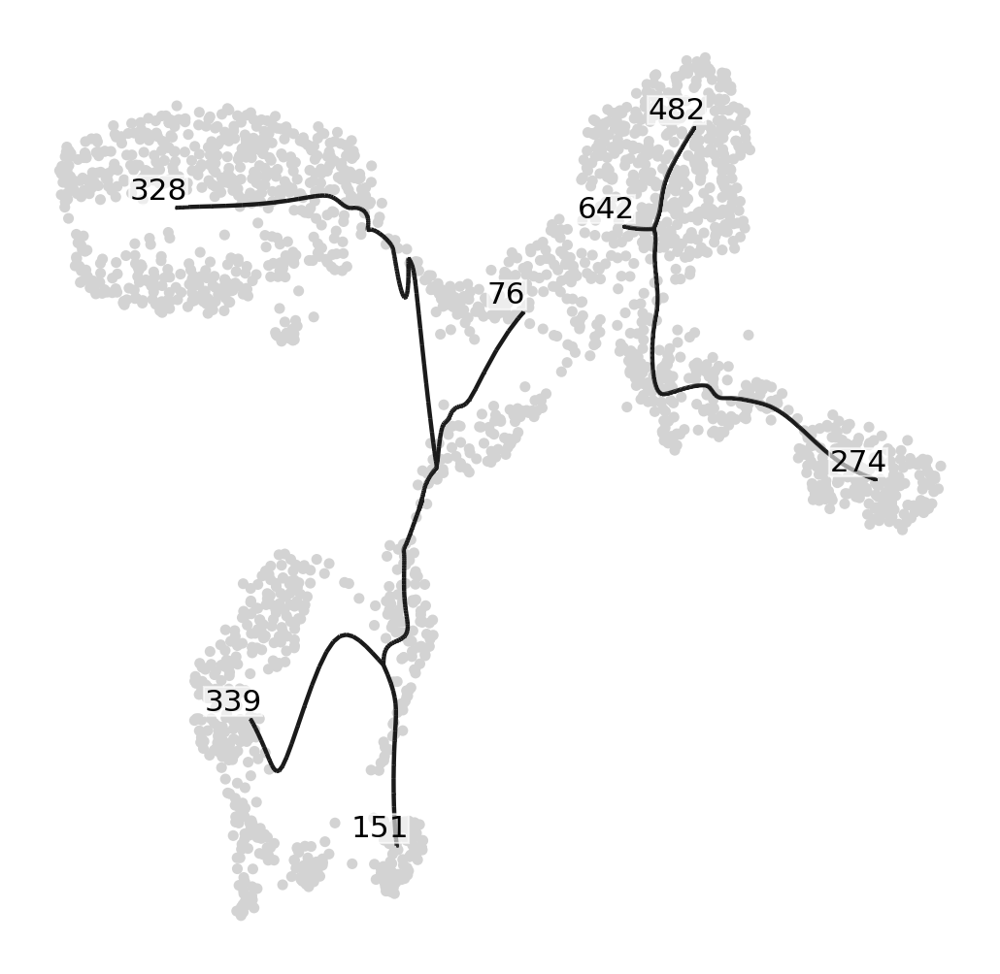

In [ ]:
%%time
ax=scf.pl.graph(adata_early,size_nodes=.1,forks=False,show=False,s=100)
scf.pl.graph(adata_late,size_nodes=.1,forks=False,show=False,s=100,ax=ax)

In [ ]:
%%time
adata_sensory = scf.tl.attach_tree(adata_early,adata_late,linkage=(642,76))

attaching tree
    merging
    tree refitting
    finished (0:00:00) --> datasets combined
CPU times: user 392 ms, sys: 176 ms, total: 568 ms
Wall time: 373 ms


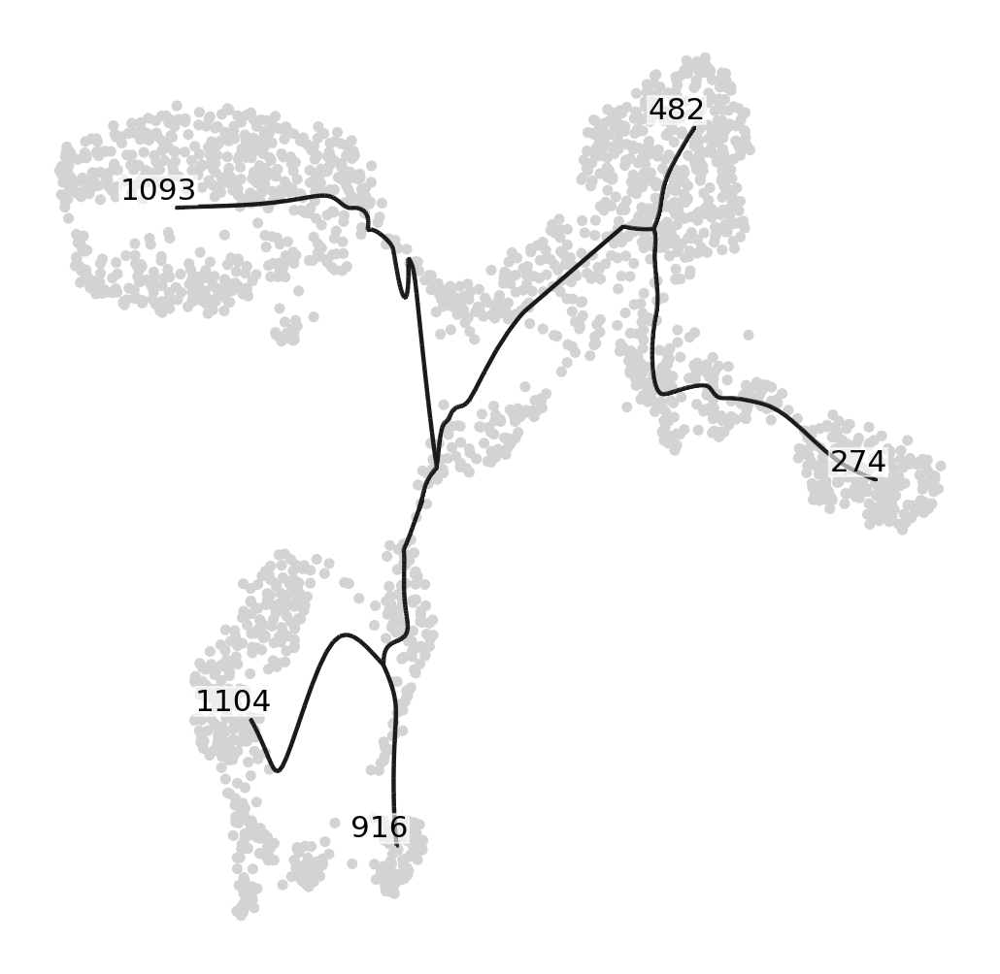

CPU times: user 289 ms, sys: 204 ms, total: 493 ms
Wall time: 268 ms


In [ ]:
%%time
scf.pl.graph(adata_sensory,size_nodes=.1,forks=False,s=100)

In [ ]:
%%time
adata_sensory.obsp = sensory_obsp

CPU times: user 72 µs, sys: 7 µs, total: 79 µs
Wall time: 83.7 µs


In [ ]:
adata_sensory.obsp

PairwiseArrays with keys: distances, connectivities

## Pseudotime analysis

In [ ]:
%%time
scf.tl.root(adata_sensory,"time",tips_only=True,min_val=True)

automatic root selection using time values
node 274 selected as a root --> added
    .uns['graph']['root'] selected root.
    .uns['graph']['pp_info'] for each PP, its distance vs root and segment assignment.
    .uns['graph']['pp_seg'] segments network information.
CPU times: user 225 ms, sys: 97.1 ms, total: 322 ms
Wall time: 206 ms


In [ ]:
%%time
scf.tl.pseudotime(adata_sensory,n_jobs=2,n_map=10,seed=42)

projecting cells onto the principal graph
    mappings: 100%|██████████| 10/10 [00:43<00:00,  4.30s/it]
    finished (0:00:44) --> added
    .obs['edge'] assigned edge.
    .obs['t'] pseudotime value.
    .obs['seg'] segment of the tree assigned.
    .obs['milestones'] milestone assigned.
    .uns['pseudotime_list'] list of cell projection from all mappings.
CPU times: user 1.83 s, sys: 258 ms, total: 2.08 s
Wall time: 44.5 s


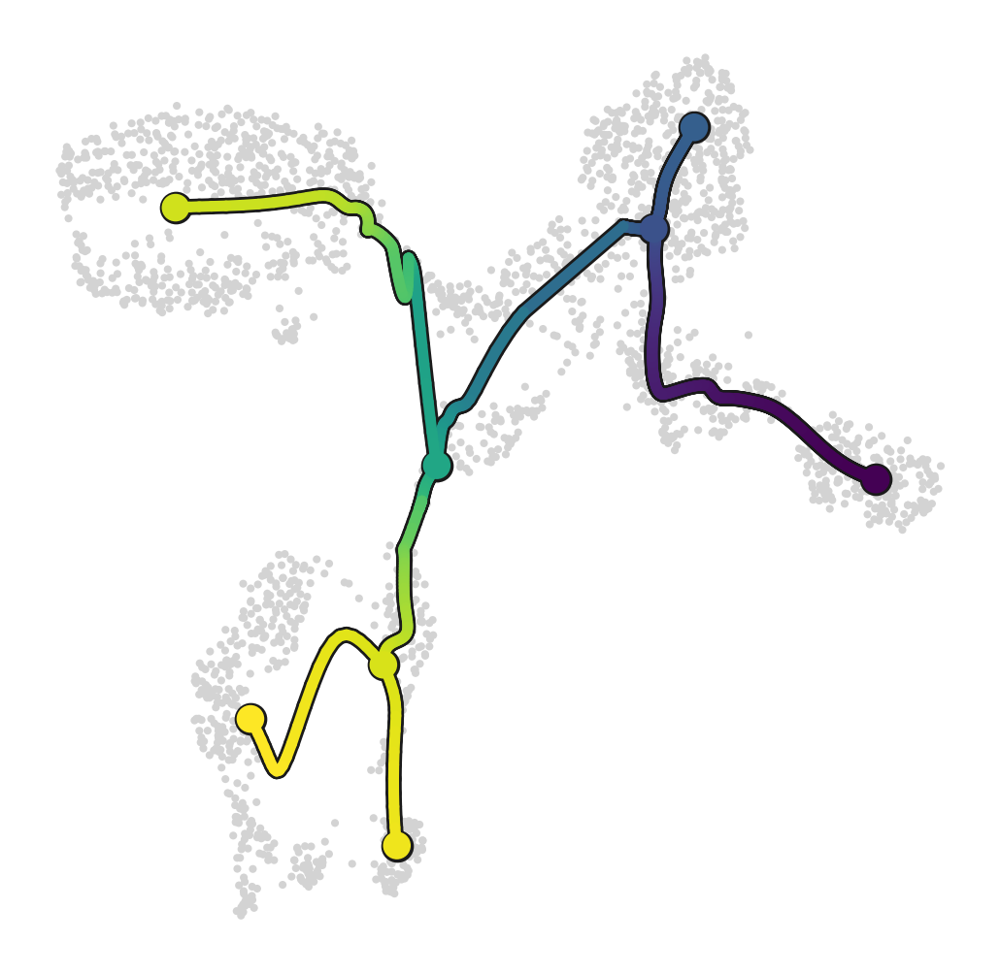

CPU times: user 1.17 s, sys: 246 ms, total: 1.42 s
Wall time: 1.13 s


In [ ]:
%%time
scf.pl.trajectory(adata_sensory)

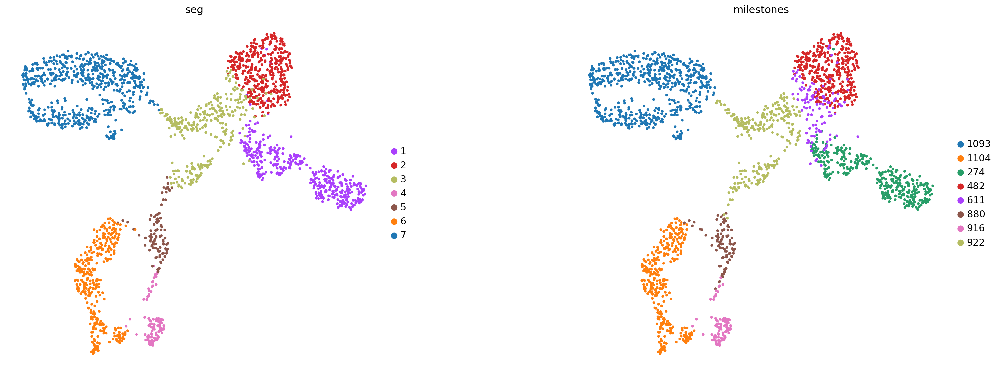

CPU times: user 417 ms, sys: 87.2 ms, total: 504 ms
Wall time: 407 ms


In [ ]:
%%time
sc.pl.scatter(adata_sensory, basis="umap", color=["seg","milestones"])

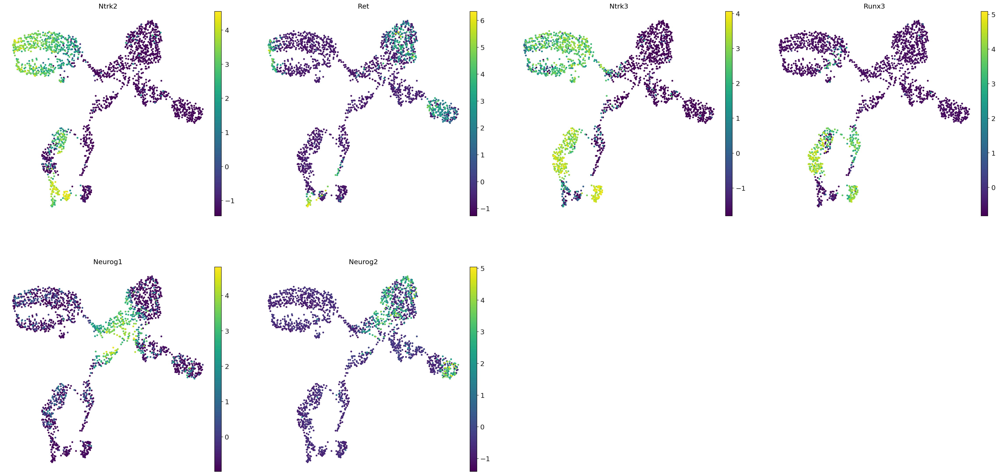

CPU times: user 1.55 s, sys: 87.8 ms, total: 1.63 s
Wall time: 1.55 s


In [ ]:
%%time
sc.pl.umap(adata_sensory,color=['Ntrk2','Ret','Ntrk3','Runx3','Neurog1','Neurog2'])

In [ ]:
scf.tl.rename_milestones(adata_sensory,list({1093:"Ret", 1104:"Ntrk3/Runx3", 274:"eNCC", 482:"BCC", 611:"lNCC", 880:"Bif2", 916:"Ntrk3", 913:"Bif1"}.values()))

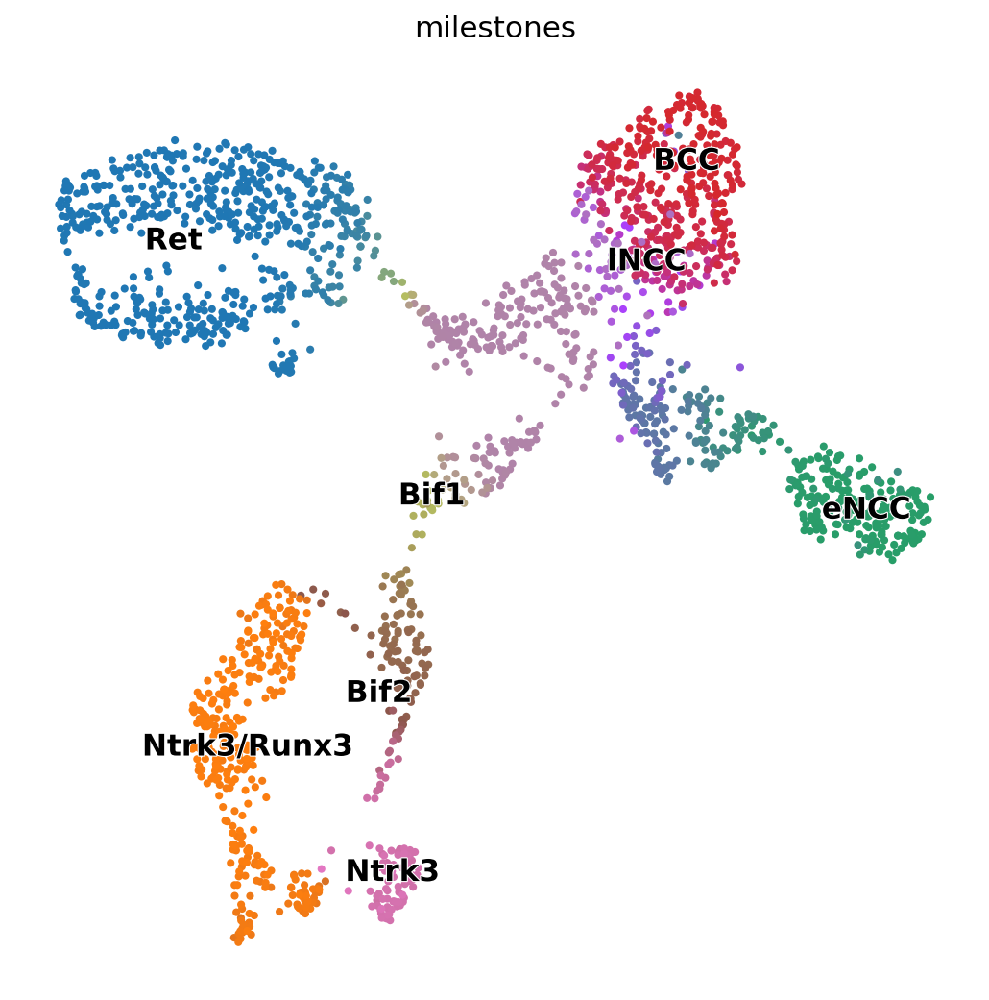

In [ ]:
scf.pl.milestones(adata_sensory,annotate=True)

In [ ]:
scf.tl.dendrogram(adata_sensory, crowdedness=1)

Generating dendrogram of tree
    segment : 100%|██████████| 7/7 [00:04<00:00,  1.55it/s]
    finished (0:00:04) --> added 
    .obsm['X_dendro'], new embedding generated.
    .uns['dendro_segments'] tree segments used for plotting.


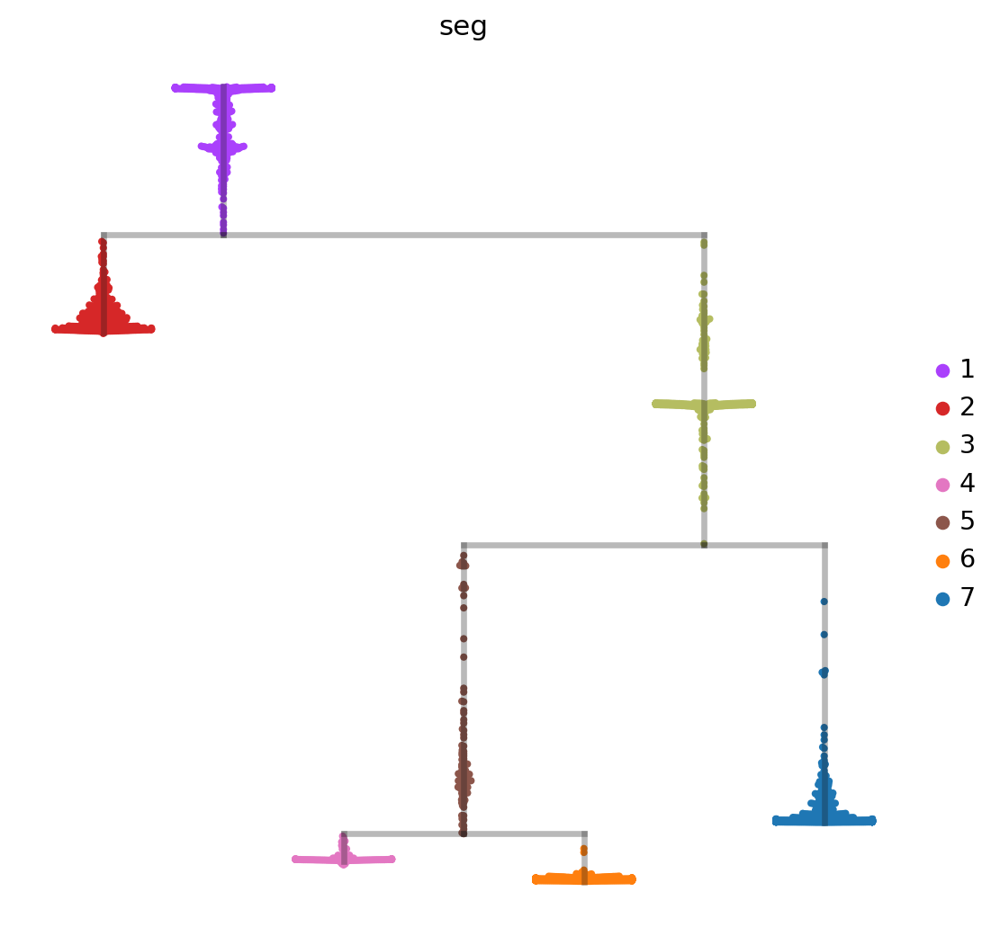

In [ ]:
scf.pl.dendrogram(adata_sensory,color="seg")

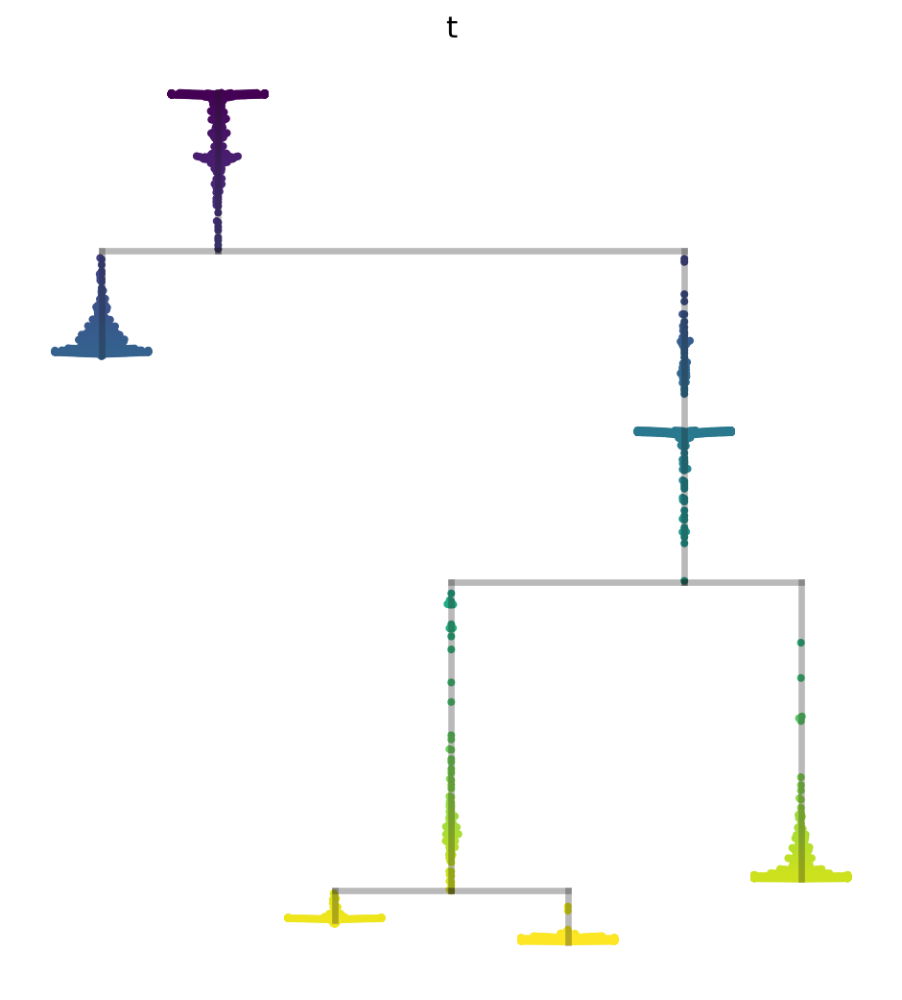

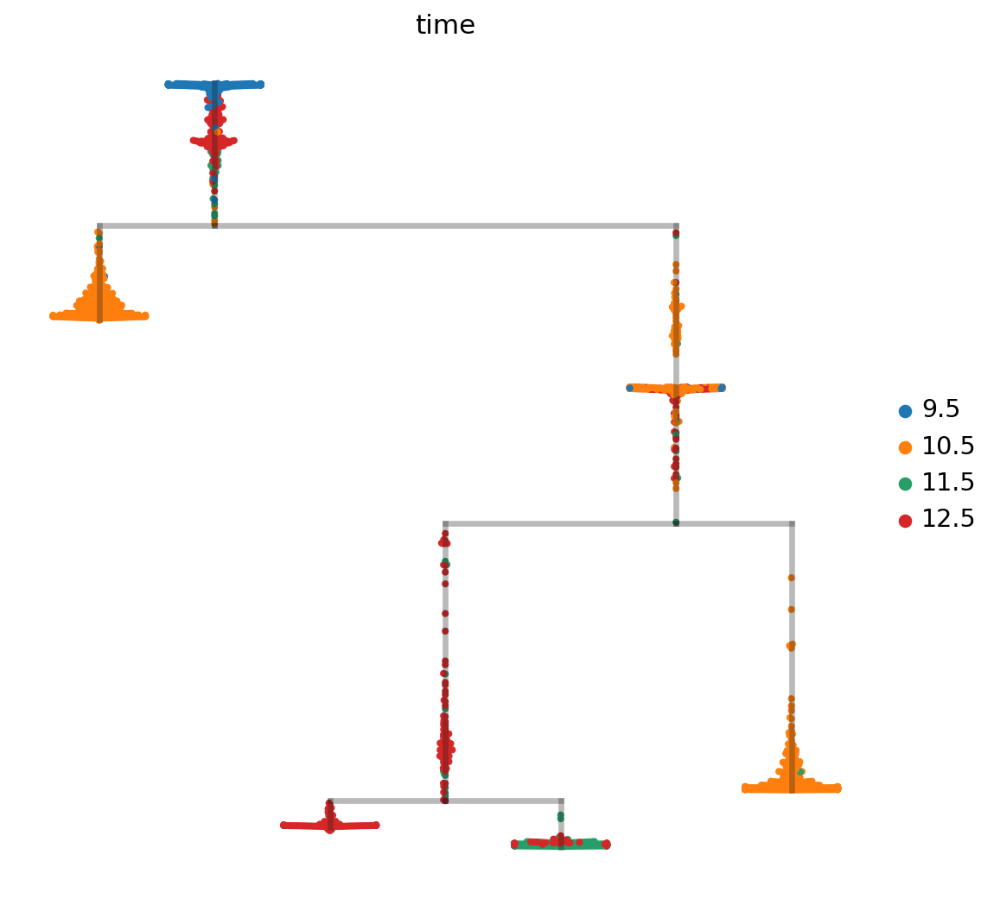

In [ ]:
sc.set_figure_params(figsize=(8,8),frameon=False,dpi_save=300)
scf.pl.dendrogram(adata_sensory,color="t",show_info=False,cmap="viridis")
# scf.pl.dendrogram(adata_sensory,color="milestones",legend_loc="on data",color_milestones=True,legend_fontoutline=True)
scf.pl.dendrogram(adata_sensory,color="time",show_info=True,cmap="viridis")

In [ ]:
%%time
# remove unused variable for more ram space
del [cnts, file_path, timeloc, plate, timeloc_dict, cell_names, timepoints, times, anno_dict, adata,
     adata_filtered, pca_projections, dm_res, ms_data, adata_early, adata_late, sensory_obsp]

CPU times: user 9 µs, sys: 0 ns, total: 9 µs
Wall time: 12.9 µs


In [ ]:
%%time
# save raw count matrix before subsetting
# adata_sensory.layers["all_genes"] = adata_sensory.X.copy()

CPU times: user 3 µs, sys: 1 µs, total: 4 µs
Wall time: 7.63 µs


In [ ]:
%%time
# only select highly variable genes to test for association for the sake of ram space and time available
# adata_sensory = adata_sensory[:, adata_sensory.var.highly_variable]

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 8.58 µs


## Test and fit features associated with the tree

In [ ]:
%%time
# amplitude cut-off >= 2
scf.tl.test_association(adata_sensory,n_jobs=2,A_cut=2)

test features for association with the trajectory
    single mapping : 100%|██████████| 21697/21697 [37:07<00:00,  9.74it/s]
    found 6394 significant features (0:37:07) --> added
    .var['p_val'] values from statistical test.
    .var['fdr'] corrected values from multiple testing.
    .var['st'] proportion of mapping in which feature is significant.
    .var['A'] amplitue of change of tested feature.
    .var['signi'] feature is significantly changing along pseudotime.
    .uns['stat_assoc_list'] list of fitted features on the graph for all mappings.
CPU times: user 4min 24s, sys: 13.5 s, total: 4min 37s
Wall time: 37min 12s


In [ ]:
scf.tl.test_association(adata_sensory,reapply_filters=True,n_jobs=2,A_cut=2)

reapplied filters, 6394 significant features


CPU times: user 72.3 ms, sys: 9.05 ms, total: 81.3 ms
Wall time: 74.2 ms


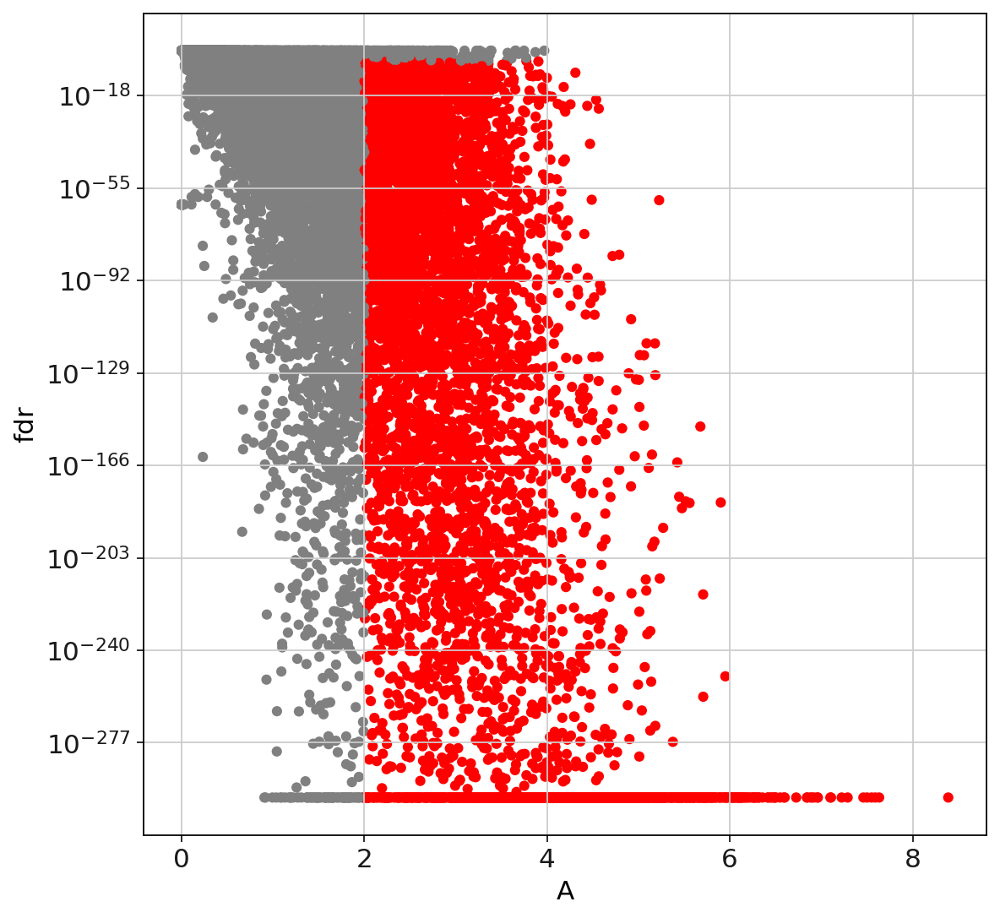

In [ ]:
%%time
scf.pl.test_association(adata_sensory)

In [ ]:
%%time
scf.tl.fit(adata_sensory,n_jobs=2)

fit features associated with the trajectory
    single mapping : 100%|██████████| 6394/6394 [24:26<00:00,  4.36it/s]
    finished (adata subsetted to keep only fitted features!) (0:24:31) --> added
    .layers['fitted'], fitted features on the trajectory for all mappings.
    .raw, unfiltered data.
CPU times: user 2min, sys: 6.09 s, total: 2min 6s
Wall time: 24min 32s


In [ ]:
adata_sensory.var

,n_cells,ERCC,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,mt,highly_variable,means,dispersions,dispersions_norm,p_val,A,fdr,st,signi
ERCC-00130,5162,True,2521,4.565745,2.475822,11802.452148,False,True,1.590859e-09,2.254197e+09,0.784600,0.000000e+00,5.792468,0.000000e+00,1,True
ERCC-00004,4545,True,2149,2.927243,16.866538,7566.921875,False,True,3.567668e-10,1.153226e+10,2.316666,0.000000e+00,6.251489,0.000000e+00,1,True
ERCC-00136,3969,True,1842,2.478260,28.742747,6406.301758,False,False,-1.518803e-10,-2.545248e+10,-4.914694,0.000000e+00,5.481707,0.000000e+00,1,True
ERCC-00108,3633,True,1640,2.292682,36.557060,5926.583984,False,False,-2.454404e-11,-1.807269e+11,-450.536346,0.000000e+00,6.024505,0.000000e+00,1,True
ERCC-00092,3576,True,1641,1.950854,36.518375,5042.958496,False,True,8.848465e-10,3.688682e+09,2.860555,0.000000e+00,4.863191,0.000000e+00,1,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Trub1,3500,False,2044,2.256062,20.928433,5831.920410,False,True,5.713301e-10,3.327658e+09,0.917530,3.835803e-73,2.223456,8.322541e-69,1,True
Slc18a2,2384,False,1659,2.204231,35.822050,5697.937988,False,True,1.124658e-09,3.176500e+09,2.119336,0.000000e+00,4.845978,0.000000e+00,1,True
Pdzd8,4224,False,2255,2.608314,12.765957,6742.492676,False,False,-9.471298e-10,-1.897521e+09,0.087605,2.393002e-24,2.397394,5.192097e-20,1,True
Rab11fip2,2035,False,1273,1.027401,50.754352,2655.832520,False,True,1.287099e-10,1.158909e+10,3.111881,1.315119e-58,2.530945,2.853415e-54,1,True


In [ ]:
# from scvelo.preprocessing.neighbors import get_connectivities
# sc.pp.neighbors(adata_sensory,n_neighbors=100,n_pcs=30)
# adata_sensory.layers["knn_smoothed"]=get_connectivities(adata_sensory).dot(adata_sensory.X)

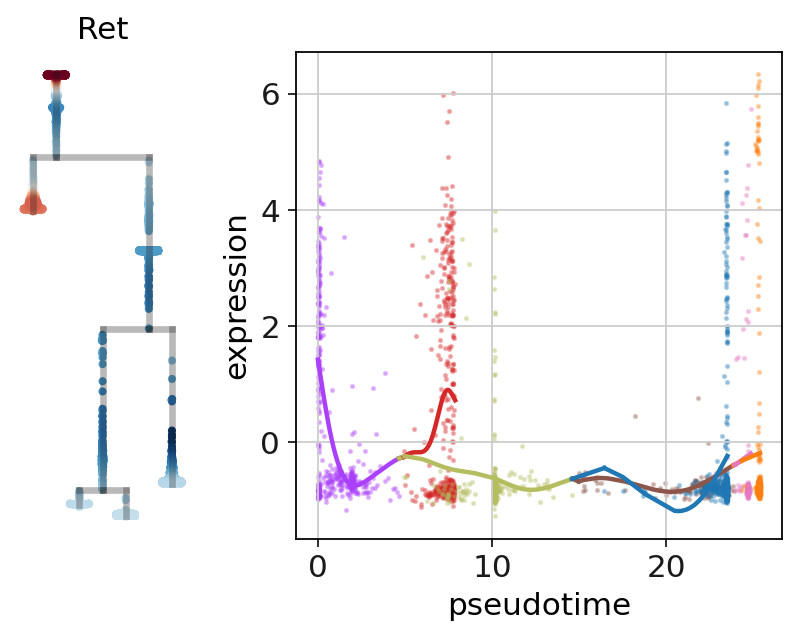

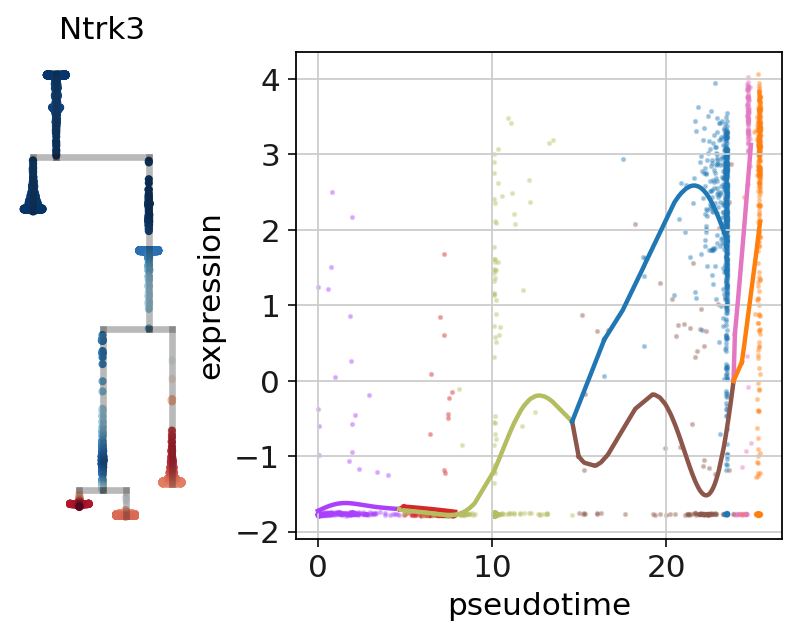

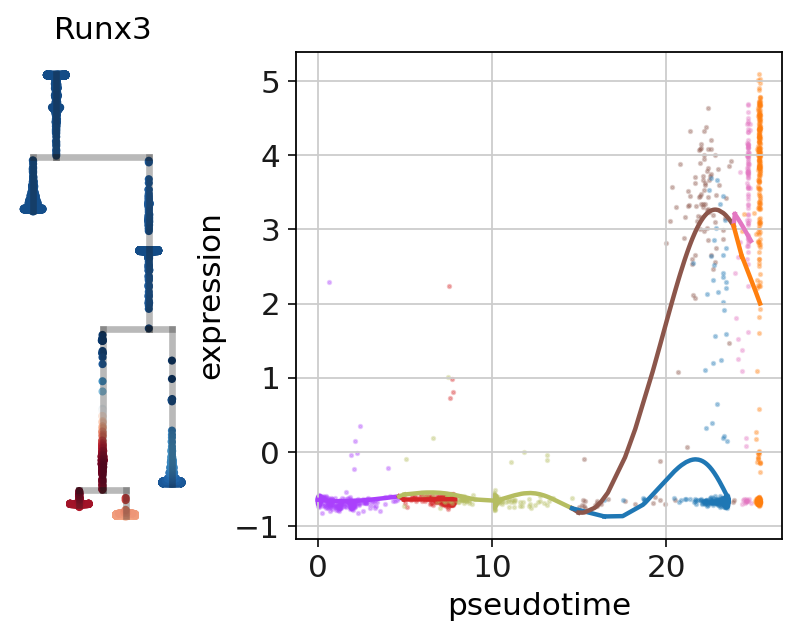

CPU times: user 1.32 s, sys: 1.2 s, total: 2.51 s
Wall time: 2.19 s


In [ ]:
%%time
gene1 = "Ret" #@param {type:"string"}
gene2 = "Ntrk3" #@param {type:"string"}
gene3 = "Runx3" #@param {type:"string"}

sc.set_figure_params(figsize=(.8,4),frameon=False)
scf.set_figure_pubready()
scf.pl.single_trend(adata_sensory,gene1,basis="dendro",wspace=-.25)
scf.pl.single_trend(adata_sensory,gene2,basis="dendro",wspace=-.25)
scf.pl.single_trend(adata_sensory,gene3,basis="dendro",wspace=-.25)

## Bifurcation analysis

In [ ]:
%%time
scf.tl.test_fork(adata_sensory,root_milestone="eNCC",milestones=["Ntrk3","Ntrk3/Runx3"],n_jobs=2,rescale=True)

testing fork
    single mapping
    Differential expression: 100%|██████████| 6394/6394 [03:43<00:00, 28.55it/s]
    test for upregulation for each leave vs root
    upreg Ntrk3/Runx3: 100%|██████████| 2579/2579 [00:12<00:00, 212.63it/s]
    finished (0:04:13) --> added 
    .uns['eNCC->Ntrk3<>Ntrk3/Runx3']['fork'], DataFrame with fork test results.
CPU times: user 36.9 s, sys: 1.38 s, total: 38.2 s
Wall time: 4min 13s


In [ ]:
%%time
scf.tl.branch_specific(adata_sensory,root_milestone="eNCC",milestones=["Ntrk3","Ntrk3/Runx3"],effect=1)

    branch specific features: Ntrk3: 113, Ntrk3/Runx3: 36
    finished --> updated 
    .uns['eNCC->Ntrk3<>Ntrk3/Runx3']['fork'], DataFrame updated with additionnal 'branch' column.
CPU times: user 6.72 ms, sys: 2.93 ms, total: 9.65 ms
Wall time: 8.65 ms


In [ ]:
%%time
scf.tl.activation_lm(adata_sensory,root_milestone="eNCC",milestones=["Ntrk3","Ntrk3/Runx3"],n_jobs=2)

    single mapping
    prefork activation: 100%|██████████| 149/149 [00:00<00:00, 170.83it/s]
    79 early and 34 late features specific to leave Ntrk3
    26 early and 10 late features specific to leave Ntrk3/Runx3
    finished (0:00:00) --> updated 
    .uns['eNCC->Ntrk3<>Ntrk3/Runx3']['fork'], DataFrame updated with additionnal 'slope','pval','fdr','prefork_signi' and 'module' columns.
CPU times: user 573 ms, sys: 33 ms, total: 606 ms
Wall time: 933 ms


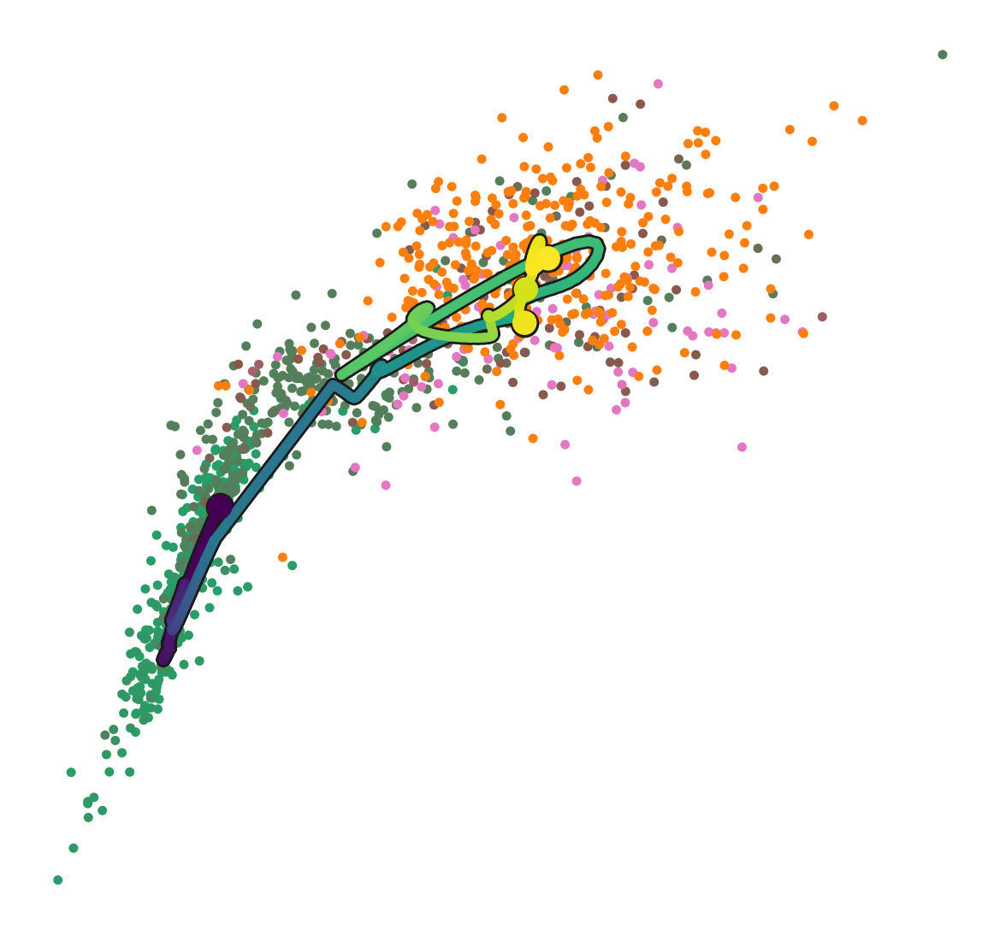

CPU times: user 3.74 s, sys: 569 ms, total: 4.31 s
Wall time: 3.99 s


In [ ]:
%%time
scf.pl.modules(adata_sensory,root_milestone="eNCC",milestones=["Ntrk3","Ntrk3/Runx3"],show_traj=True,
               smooth=True,module="early")

In [ ]:
%%time
scf.tl.slide_cells(adata_sensory,root_milestone="eNCC",milestones=["Ntrk3","Ntrk3/Runx3"],win=175)
scf.tl.slide_cors(adata_sensory,root_milestone="eNCC",milestones=["Ntrk3","Ntrk3/Runx3"])

--> added 
    .uns['eNCC->Ntrk3<>Ntrk3/Runx3']['cell_freq'], probability assignment of cells on 9 non intersecting windows.
--> added 
    .uns['eNCC->Ntrk3<>Ntrk3/Runx3']['corAB'], gene-gene correlation modules.
CPU times: user 218 ms, sys: 148 ms, total: 366 ms
Wall time: 277 ms


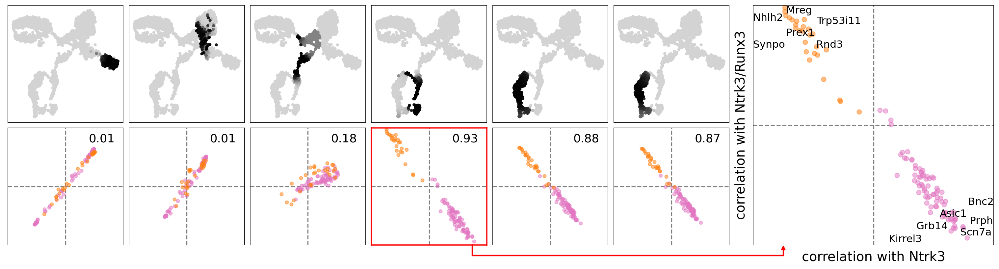

CPU times: user 3.74 s, sys: 568 ms, total: 4.31 s
Wall time: 3.73 s


In [ ]:
%%time
sc.set_figure_params()
scf.pl.slide_cors(adata_sensory,root_milestone="eNCC",milestones=["Ntrk3","Ntrk3/Runx3"],win_keep=[0,2,4,5,7,8],
                 focus=3,top_focus=6)

In [ ]:
%%time
scf.tl.synchro_path(adata_sensory,root_milestone="eNCC",milestones=["Ntrk3","Ntrk3/Runx3"],w=150,n_map=10,n_jobs=2)

computing local correlations
    multi mapping permutations: 100%|██████████| 10/10 [00:17<00:00,  1.74s/it]
    finished (0:00:32) --> added 
    .uns['eNCC->Ntrk3<>Ntrk3/Runx3']['synchro'], mean local gene-gene correlations of all possible gene pairs inside one module, or between the two modules.
    .obs['inter_cor eNCC->Ntrk3<>Ntrk3/Runx3'], GAM fit of inter-module mean local gene-gene correlations prior to bifurcation.
CPU times: user 2.17 s, sys: 767 ms, total: 2.93 s
Wall time: 32.4 s


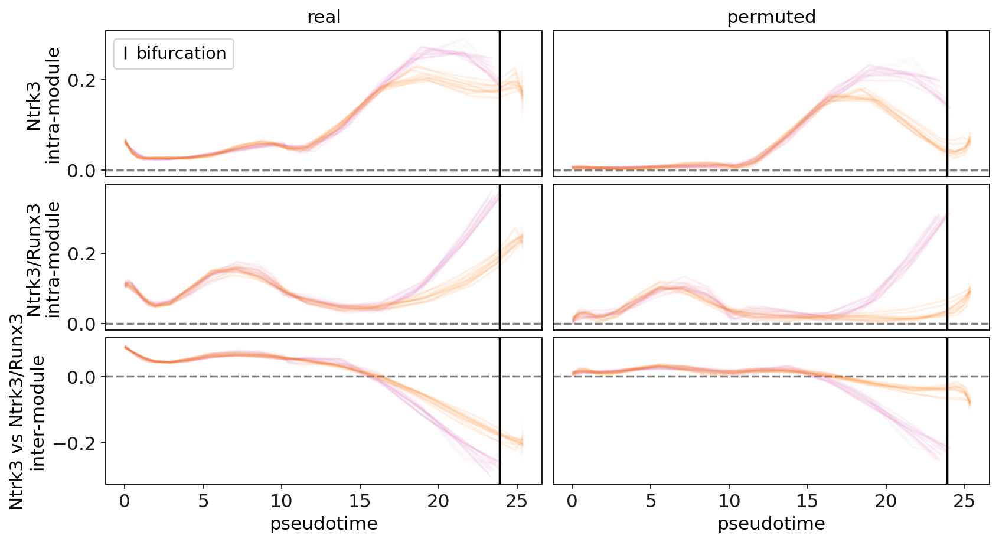

CPU times: user 3.48 s, sys: 2.59 s, total: 6.07 s
Wall time: 3.34 s


In [ ]:
%%time
scf.pl.synchro_path(adata_sensory,root_milestone="eNCC",milestones=["Ntrk3","Ntrk3/Runx3"])

In [ ]:
scf.tl.module_inclusion(adata_sensory,root_milestone="eNCC",milestones=["Ntrk3","Ntrk3/Runx3"],n_jobs=2,n_map=10,parallel_mode="mappings")

Calculating onset of features within their own module
    multi mapping: 100%|██████████| 10/10 [01:21<00:00,  8.18s/it]
    finished (0:01:21) --> added 
    .uns['eNCC->Ntrk3<>Ntrk3/Runx3']['module_inclusion'], milestone specific dataframes containing inclusion timing for each gene in each probabilistic cells projection.
    .uns['eNCC->Ntrk3<>Ntrk3/Runx3']['fork'] has been updated with the column 'inclusion'.


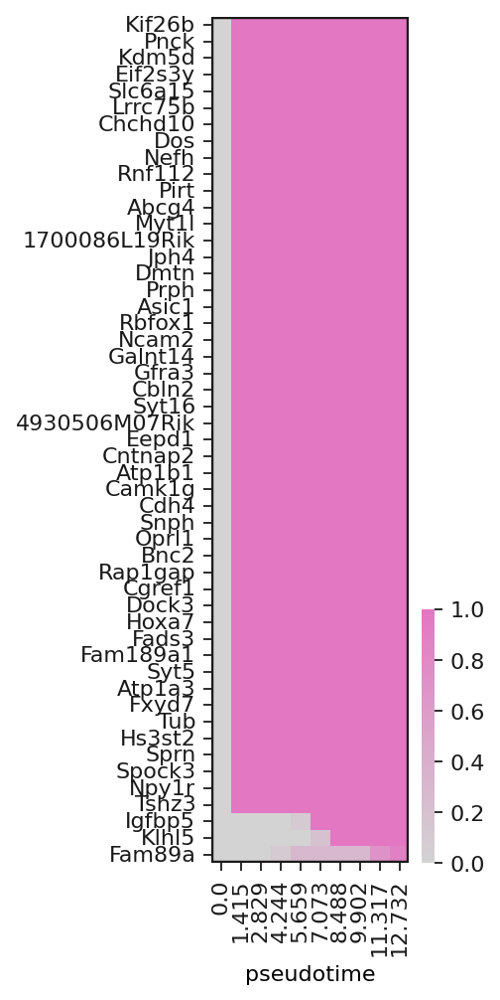

In [ ]:
sc.set_figure_params(fontsize=10)
scf.pl.module_inclusion(adata_sensory,root_milestone="eNCC",milestones=["Ntrk3","Ntrk3/Runx3"],
                        bins=10,branch="Ntrk3",figsize=(2,7))

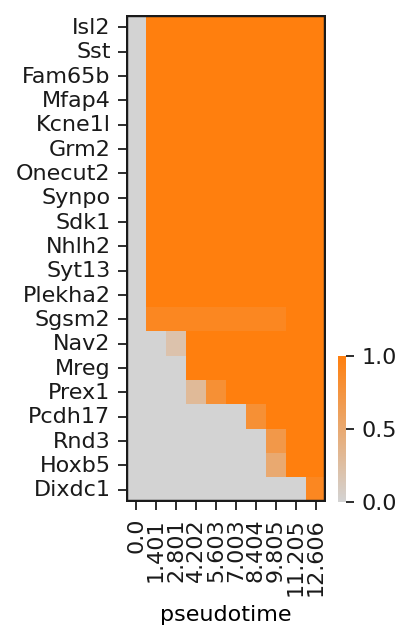

In [ ]:
scf.pl.module_inclusion(adata_sensory,root_milestone="eNCC",milestones=["Ntrk3","Ntrk3/Runx3"],
                        bins=10,branch="Ntrk3/Runx3",figsize=(2,4))

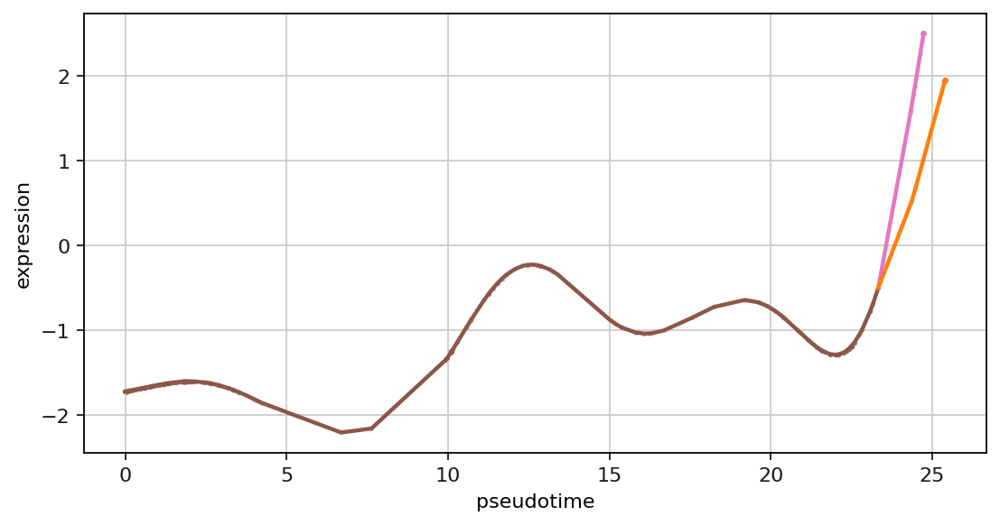

CPU times: user 3.69 s, sys: 660 ms, total: 4.35 s
Wall time: 3.68 s


In [ ]:
%%time
scf.pl.single_trend(adata_sensory,"Ntrk3",root_milestone="eNCC",layer="fitted",milestones=["Ntrk3","Ntrk3/Runx3"],plot_emb=False)

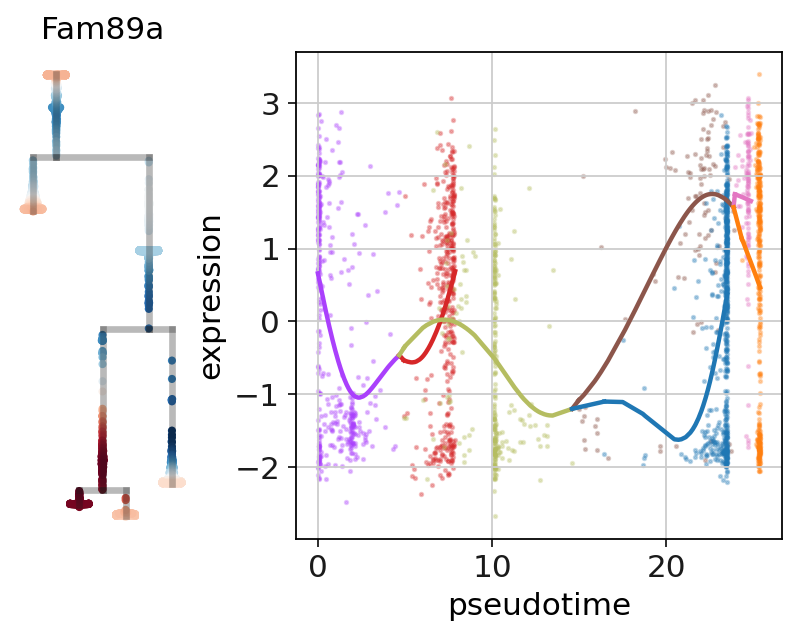

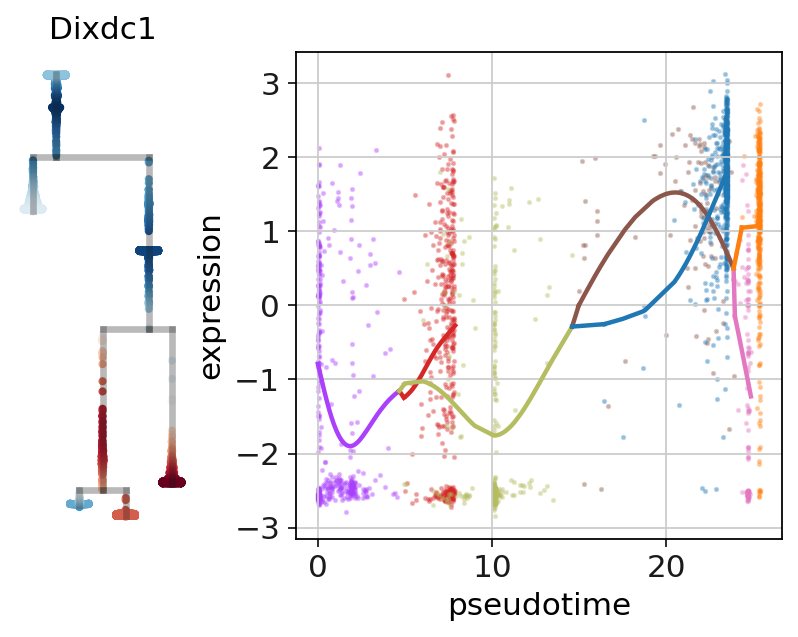

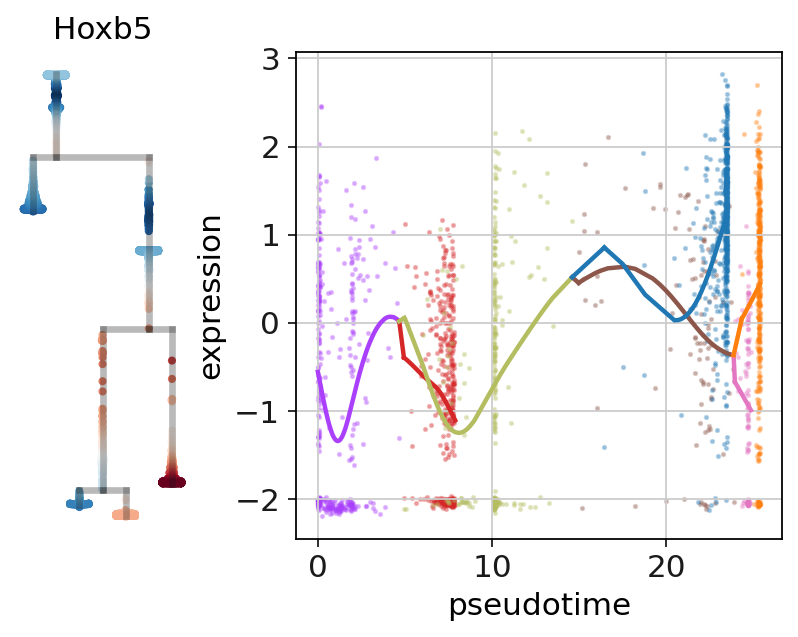

CPU times: user 1.84 s, sys: 1.17 s, total: 3.01 s
Wall time: 3.74 s


In [ ]:
%%time
gene1 = "Fam89a" #@param {type:"string"}
gene2 = "Dixdc1" #@param {type:"string"}
gene3 = "Hoxb5" #@param {type:"string"}

sc.set_figure_params(figsize=(.8,4),frameon=False)
scf.set_figure_pubready()
scf.pl.single_trend(adata_sensory,gene1,basis="dendro",wspace=-.25)
scf.pl.single_trend(adata_sensory,gene2,basis="dendro",wspace=-.25)
scf.pl.single_trend(adata_sensory,gene3,basis="dendro",wspace=-.25)